# Libraries

## I/O

In [1]:
import os
from pprint import pprint
import pickle
import json
from datetime import datetime

from util_IO import (
    load_pickle_from_main_project_dir,
    load_attributes_df,
    get_stadiamaps_provider_api_key_in_env,
    get_mlflow_tracking_uri,
    geo_plot_basic
)

## Analysis

In [2]:
import warnings
import random

import math
import numpy as np
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
from matplotlib_venn import venn2
import seaborn as sns

from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    root_mean_squared_error,
    r2_score
)
from sklearn.exceptions import UndefinedMetricWarning

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate, BatchNormalization
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsoluteError, MeanAbsolutePercentageError
from tensorflow.keras.callbacks import EarlyStopping

import mlflow
from inequalipy import gini

2025-06-08 19:08:27.334917: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-06-08 19:08:28.268935: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64:/usr/lib/x86_64-linux-gnu/:/opt/conda/lib
2025-06-08 19:08:28.269091: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local

# Settings

## Packages

In [3]:
# Set pandas to display a maximum of 300 columns
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 1000)

# Suppress the SettingWithCopyWarning
pd.options.mode.chained_assignment = None

pd.set_option('display.float_format', '{:.3f}'.format)

# Suppresses warnings related to the R² score by year
warnings.filterwarnings("ignore", category=UndefinedMetricWarning)

# Set seed
random.seed(82)
np.random.seed(82)
tf.random.set_seed(82)

# Retrieve provider for maps
stadiamaps_provider = get_stadiamaps_provider_api_key_in_env()

# Set mlflow server
mlflow.set_tracking_uri(
    uri=get_mlflow_tracking_uri()
)

# Set autolog properties
mlflow.keras.autolog()

## Parameters

### Load metadata from *1-DataAggregation.ipynb*

In [4]:
aggr_parameters_dict, camels_gb_use_case_dir = load_pickle_from_main_project_dir(
    'aggr_parameters_dict.pkl'
)

# # Print imported variable
pprint(aggr_parameters_dict)

{'attributes': {'aggregations': {'fundamental': {'chalk_streams_df': ['chalk_stream_flag'],
                                                 'climatic_attributes_df': [],
                                                 'humaninfluence_attributes_df': ['surfacewater_abs',
                                                                                  'groundwater_abs',
                                                                                  'discharges',
                                                                                  'num_reservoir',
                                                                                  'reservoir_cap'],
                                                 'hydrogeology_attributes_df': [],
                                                 'hydrologic_attributes_df': ['baseflow_index'],
                                                 'hydrometry_attributes_df': ['bankfull_flow'],
                                                 'landc

In [5]:
# Variables picked
date_field = aggr_parameters_dict['timeseries']['date_field']
attributes_index = aggr_parameters_dict["attributes"]["attributes_index"]
camels_gb_datasets_dir = aggr_parameters_dict["camels_gb_datasets_dir"]
camels_gb_data_attributes_aggr_dir = aggr_parameters_dict["camels_gb_data_attributes_aggr_dir"]
camels_gb_bronze_dir = aggr_parameters_dict['camels_gb_bronze_dir']
camels_gb_silver_dir = aggr_parameters_dict['camels_gb_silver_dir']

temp_files_dir = f"{camels_gb_use_case_dir}/temp"

### Model feed parameters

In [6]:
# Model feed parameters
sequence_length = 30
label_field = 'discharge_vol' # log1p_discharge_vol / discharge_vol
start_year = 1985
bfi = "Y"
cs = "Y"
csf = "N"

# Derive model feed ID
model_feed_ID = f"w{sequence_length}-{label_field}-{start_year}-bfi_{bfi}-cs_{cs}_csf-{csf}"
print(model_feed_ID)

w30-discharge_vol-1985-bfi_Y-cs_Y_csf-N


### Set MLflow experiment name

In [7]:
# Set MLflow Experiment linked to the model feed ID
curr_experiment = mlflow.set_experiment(
    model_feed_ID
)

# Load model feed

## Feed dictionary

In [8]:
# Read dictionary
with open(
    os.path.join(
        camels_gb_silver_dir,
        f"model_feed-{model_feed_ID}.pkl"
    ),
    'rb'
) as f:
    model_feed = pickle.load(f)
    
# Print imported variable
pprint(model_feed.keys())

dict_keys(['bfi', 'cs', 'csf', 'train_size', 'test_size', 'min_required_obs', 'X_minmax_columns_names_list', 'X_standard_columns_names_list', 'X_no_scaled_columns_names_list', 'X_static_standard_columns_names_list', 'X_static_no_scaled_columns_names_list', 'X_train', 'y_train', 'X_test', 'y_test', 'X_train_static_df', 'X_test_static_df', 'X_train_registry_df', 'X_test_registry_df', 'X_preprocessor', 'X_static_preprocessor', 'X_cols_names', 'X_static_cols_names', 'label_field_model'])


## Feed variables split

In [9]:
for key, value in model_feed.items():
    
    globals()[key] = value
    
    try:
        if isinstance(value, list):
            print(f"`{key}` ingested with dimension: {len(value)}")
        else:
            print(f"`{key}` ingested with dimension: {value.shape}")
    except:
        print(f"`{key}` ingested")

assert label_field_model==label_field, "Inconsistency with label's field" 

`bfi` ingested
`cs` ingested
`csf` ingested
`train_size` ingested
`test_size` ingested
`min_required_obs` ingested
`X_minmax_columns_names_list` ingested with dimension: 1
`X_standard_columns_names_list` ingested with dimension: 6
`X_no_scaled_columns_names_list` ingested with dimension: 2
`X_static_standard_columns_names_list` ingested with dimension: 26
`X_static_no_scaled_columns_names_list` ingested with dimension: 1
`X_train` ingested with dimension: (2403628, 30, 9)
`y_train` ingested with dimension: (2403628,)
`X_test` ingested with dimension: (940116, 30, 9)
`y_test` ingested with dimension: (940116,)
`X_train_static_df` ingested with dimension: (2403628, 27)
`X_test_static_df` ingested with dimension: (940116, 27)
`X_train_registry_df` ingested with dimension: (2403628, 4)
`X_test_registry_df` ingested with dimension: (940116, 4)
`X_preprocessor` ingested
`X_static_preprocessor` ingested
`X_cols_names` ingested with dimension: 9
`X_static_cols_names` ingested with dimension: 2

### Data frame conversion

In [10]:
X_train_static = X_train_static_df.values
X_test_static = X_test_static_df.values

X_train = np.array(X_train, dtype=np.float32)
X_train_static = np.array(X_train_static, dtype=np.float32)

X_test = np.array(X_test, dtype=np.float32)
X_test_static = np.array(X_test_static, dtype=np.float32)

# Model train and evaluation

## Model dimensions

In [11]:
train_val_prop = 0.8
n_obs_train, ts, n_dynamic_vars = X_train.shape
n_static_var = X_train_static.shape[1]
train_val_index = int(train_val_prop * n_obs_train)
batch_size = 128

## Model parameters

In [12]:
LSTM_hidden_size_layer_1 = 128
LSTM_hidden_size_layer_2 = 128

encoder_dense_layer_1_multiplier = 1.5
encoder_dense_layer_2_multiplier = 0.75

concatenated_dense_layer = 64
dense_output_activation = 'exponential' # 'exponential' / 'softplus'
loss = 'MAE' # 'MAE' / 'MAPE'
early_stopping_monitor = 'val_mean_absolute_percentage_error' if loss=='MAPE' else 'val_mean_absolute_error'

## MLflow start run

In [13]:
# Start MLflow run
run = mlflow.start_run(run_name=f"{dense_output_activation}-{loss}")

## MLflow log parameters

In [14]:
# _____________________
# Input data parameters
mlflow.log_params(
    {
        'sequence_length': sequence_length,
        'label_field': label_field,
        'start_year': start_year,
        'bfi': bfi,
        'cs': cs,
        'csf': csf,
        'model_feed_ID': model_feed_ID,
        'train_size': train_size,
        'test_size': test_size,
        'min_required_obs': min_required_obs
    }
)

mlflow.log_params(
    {
        'X_train_dim': " | ".join([f"{num:,}" for num in X_train.shape]),
        'y_train_dim': " | ".join([f"{num:,}" for num in y_train.shape]),
        'X_test_dim': " | ".join([f"{num:,}" for num in X_test.shape]),
        'y_test_dim': " | ".join([f"{num:,}" for num in y_test.shape]),
        'X_train_static_df_dim': " | ".join([f"{num:,}" for num in X_train_static_df.shape]),
        'X_test_static_df_dim': " | ".join([f"{num:,}" for num in X_test_static_df.shape]),
        'X_train_registry_df_dim': " | ".join([f"{num:,}" for num in X_train_registry_df.shape]),
        'X_test_registry_df_dim': " | ".join([f"{num:,}" for num in X_test_registry_df.shape])
    }
)


# ________________
# Input data lists
lists_to_log_names = [
    'X_static_no_scaled_columns_names_list',
    'X_minmax_columns_names_list',
    'X_no_scaled_columns_names_list',
    'X_static_standard_columns_names_list',
    'X_static_cols_names',
    'X_standard_columns_names_list',
    'X_cols_names'
]

for list_name in lists_to_log_names:

    temp_file = os.path.join(
        temp_files_dir,
        f"{list_name}.json"
    )
    
    # Dump the data to a JSON file
    with open(temp_file, 'w') as file:
        json.dump(globals()[list_name], file)

    # Log as artifact
    mlflow.log_artifact(
        temp_file,
        "parameter_lists"
    )


# ________________
# Model dimensions
mlflow.log_params(
    {
        'train_val_prop': train_val_prop,
        'n_obs_train': n_obs_train,
        'ts': ts,
        'n_dynamic_vars': n_dynamic_vars,
        'n_static_var': n_static_var,
        'train_val_index': train_val_index,
        'batch_size': batch_size
    }
)


# ________________
# Model parameters
mlflow.log_params(
    {
        'LSTM_hidden_size_layer_1': LSTM_hidden_size_layer_1,
        'LSTM_hidden_size_layer_2': LSTM_hidden_size_layer_2,
        'encoder_dense_layer_1_multiplier': encoder_dense_layer_1_multiplier,
        'encoder_dense_layer_2_multiplier': encoder_dense_layer_2_multiplier,
        'concatenated_dense_layer': concatenated_dense_layer,
        'dense_output_activation': dense_output_activation,
        'loss': loss,
        'early_stopping_monitor': early_stopping_monitor
    }
)

## Model definition

In [15]:
# ___________
# LSTM branch
lstm_input = Input(shape=(sequence_length, n_dynamic_vars), name='lstm_input')
lstm = LSTM(LSTM_hidden_size_layer_1, return_sequences=True)(lstm_input)
lstm = LSTM(LSTM_hidden_size_layer_2)(lstm)


# ______________
# Encoder branch
encoder_input = Input(shape=(n_static_var,), name='encoder_input')

encoder = (
    Dense(
        n_static_var * encoder_dense_layer_1_multiplier,
        activation='relu'
    )
)(encoder_input)


encoder = (
    Dense(
        n_static_var * encoder_dense_layer_2_multiplier,
        activation='relu'
    )
)(encoder)


# ________________________
# Concatenation and output

# Concatenate the outputs of the two branches
concatenated = Concatenate()([lstm, encoder])
concatenated = Dense(concatenated_dense_layer, activation='relu')(concatenated)
concatenated = BatchNormalization()(concatenated)

# Pass the concatenated output to a dense layer
dense_output = Dense(1, activation=dense_output_activation, name='output')(concatenated)

# Create the model
model = Model(inputs=[lstm_input, encoder_input], outputs=dense_output)

2025-06-08 19:08:40.634205: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-06-08 19:08:40.638092: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-06-08 19:08:40.641844: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-06-08 19:08:40.645424: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-06-08 19:08:40.680478: I tensorflow/compiler/xla/stream_executo

In [16]:
# Compile the model
model.compile(
    optimizer='adam',
    loss=loss,
    metrics=[RootMeanSquaredError(), MeanAbsoluteError(), MeanAbsolutePercentageError()]
)

# Print the model summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 lstm_input (InputLayer)        [(None, 30, 9)]      0           []                               
                                                                                                  
 encoder_input (InputLayer)     [(None, 27)]         0           []                               
                                                                                                  
 lstm (LSTM)                    (None, 30, 128)      70656       ['lstm_input[0][0]']             
                                                                                                  
 dense (Dense)                  (None, 40)           1120        ['encoder_input[0][0]']          
                                                                                              

## Dataset preparation

In [17]:
# Create the training dataset
train_dataset = (
    tf.data.Dataset
        .from_tensor_slices(
            (
                (X_train[:train_val_index], X_train_static[:train_val_index]),
                y_train[:train_val_index]
            )
        )
        .batch(batch_size)
)


# Create the validation dataset
val_dataset = (
    tf.data.Dataset
        .from_tensor_slices(
            (
                (X_train[train_val_index:], X_train_static[train_val_index:]),
                y_train[train_val_index:]
            )
        )
        .batch(batch_size)
)

## Model training

In [18]:
# _______________
# Train the model

# EarlyStopping
early_stopping = EarlyStopping(
    monitor=early_stopping_monitor,
    patience=3,
    restore_best_weights=True
)


# FIT!
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=50,
    callbacks=[early_stopping]
)

2025/06/08 19:08:58 WARNING mlflow.data.tensorflow_dataset: Failed to infer schema for TensorFlow dataset. Exception: Failed to infer schema for tf.data.Dataset. Schemas can only be inferred if the dataset consists of tensors. Ragged tensors, tensor arrays, and other types are not supported. Additionally, datasets with nested tensors are not supported.
2025/06/08 19:09:01 WARNING mlflow.data.tensorflow_dataset: Failed to infer schema for TensorFlow dataset. Exception: Failed to infer schema for tf.data.Dataset. Schemas can only be inferred if the dataset consists of tensors. Ragged tensors, tensor arrays, and other types are not supported. Additionally, datasets with nested tensors are not supported.


Epoch 1/50


2025-06-08 19:09:05.101905: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8900
2025-06-08 19:09:05.183193: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fde6c925da0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-08 19:09:05.183239: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-06-08 19:09:05.183247: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2025-06-08 19:09:05.183254: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (2): Tesla T4, Compute Capability 7.5
2025-06-08 19:09:05.183260: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (3): Tesla T4, Compute Capability 7.5
2025-06-08 19:09:05.189025: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, s

15023/15023 [==============================] - 140s 9ms/step - loss: 1.9998 - root_mean_squared_error: 8.8105 - mean_absolute_error: 1.9998 - mean_absolute_percentage_error: 693665.1875 - val_loss: 1.5559 - val_root_mean_squared_error: 5.7474 - val_mean_absolute_error: 1.5559 - val_mean_absolute_percentage_error: 582762.1875
Epoch 2/50
15023/15023 [==============================] - 135s 9ms/step - loss: 1.6033 - root_mean_squared_error: 6.4817 - mean_absolute_error: 1.6033 - mean_absolute_percentage_error: 537916.6250 - val_loss: 1.5977 - val_root_mean_squared_error: 6.6469 - val_mean_absolute_error: 1.5977 - val_mean_absolute_percentage_error: 412152.8750
Epoch 3/50
15023/15023 [==============================] - 132s 9ms/step - loss: 1.4708 - root_mean_squared_error: 5.8719 - mean_absolute_error: 1.4708 - mean_absolute_percentage_error: 470831.2188 - val_loss: 1.2561 - val_root_mean_squared_error: 4.7722 - val_mean_absolute_error: 1.2561 - val_mean_absolute_percentage_error: 415215.00

2025/06/08 19:56:35 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: Cannot log input example or model signature for input with type <class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>. TensorFlow Keras autologging can only log input examples and model signatures for the following input types: numpy.ndarray, dict[string -> numpy.ndarray], tensorflow.keras.utils.Sequence, and tensorflow.data.Dataset (TensorFlow >= 2.1.0 required)
2025/06/08 19:56:35 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: /var/tmp/tmp6oh9atec/model/data/model/assets


INFO:tensorflow:Assets written to: /var/tmp/tmp6oh9atec/model/data/model/assets
2025/06/08 19:56:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


## Test set evaluation

In [19]:
# Evaluate the model on test data
test_loss, test_rmse, test_mae, test_mape = model.evaluate([X_test, X_test_static], y_test)
print(f"Root Mean Squared Error:\t{test_rmse}\nMean Absolute Error:\t\t{test_mae}\nMean Absolute Percentage Error:\t{test_mape}")

# Log test metrics
mlflow.log_metrics({
    'test_loss': test_loss,
    'test_rmse': test_rmse,
    'test_mae': test_mae,
    'test_mape': test_mape,
})

29379/29379 [==============================] - 120s 4ms/step - loss: 0.9525 - root_mean_squared_error: 3.6894 - mean_absolute_error: 0.9525 - mean_absolute_percentage_error: 257089.7031
Root Mean Squared Error:	3.6893908977508545
Mean Absolute Error:		0.9524998664855957
Mean Absolute Percentage Error:	257089.703125


## Predictions

In [20]:
# Predictions
y_train_hat = model.predict(
    train_dataset.concatenate(val_dataset)
)

y_test_hat = model.predict([X_test, X_test_static])

29379/29379 [==============================] - 91s 3ms/step


## Anti-transformation

In [21]:
# Grab the prefix from the name of the field used for label
prefix = label_field_model.split("_")[0]

# Define the anti-transformation function
if prefix=="log1p":
    anti_transformation_func = np.expm1
else:
    anti_transformation_func = lambda x: x

print(f"Function applied:\t{anti_transformation_func}")

# Anti-transformation
y_train_anti_transf = anti_transformation_func(y_train)
y_test_anti_transf = anti_transformation_func(y_test)

y_train_hat_anti_transf = anti_transformation_func(y_train_hat).reshape(-1)
y_test_hat_anti_transf = anti_transformation_func(y_test_hat).reshape(-1)

Function applied:	<function <lambda> at 0x7fe48819e710>


# Error analysis

## Catchments geo-references

### Data frame creation

In [22]:
# Load polygons
gdf_catchments = gpd.read_file(
    os.path.join(
        camels_gb_bronze_dir,
        'CAMELS_GB_catchment_boundaries',
        'CAMELS_GB_catchment_boundaries.shp'
    )
)

# Derive area in squared km
gdf_catchments['area_sqkm'] = gdf_catchments['geometry'].area / 1e6

### Retrieving flow gauging station locations

In [23]:
# Retrieving flow gauging station locations
gauging_station_locations = load_attributes_df(
    camels_gb_data_attributes_aggr_dir,
    "fundamental_locations_postFEa.csv",
    attributes_index
)

# Convert flow gauging station locations pandas df into geopandas
gdf_gauging_station_locations = (
    gpd.GeoDataFrame(
        gauging_station_locations,
        geometry=(
            gpd.points_from_xy(
                gauging_station_locations['gauge_lon'],
                gauging_station_locations['gauge_lat']
            )
        ),
        crs="EPSG:4326"
    )
)

gdf_gauging_station_locations = gdf_gauging_station_locations.to_crs(gdf_catchments.crs)


# Merge
# ⚠️ `right` join -> `gdf_catchments` reduces in rows
gdf_catchments = (
    gdf_catchments
        .merge(
            gdf_gauging_station_locations,
            left_on='ID_STRING',
            right_index=True,
            how='right',
            suffixes=(
                '_catchment',
                '_flow-gauging-station'
            )
        )
)

assert gdf_catchments.isna().sum().sum() == 0, "Some unexpected NaN"


# Rename the geometry columns
gdf_catchments = (
    gdf_catchments
        .rename(
            columns={
                'geometry_catchment': 'catchment_geom',
                'geometry_flow-gauging-station': 'flow-gauging-station_geom'
            }
        )
)


# Set one as the active geometry
gdf_catchments = gdf_catchments.set_geometry('flow-gauging-station_geom')

### Retrieving benchmark catchments flag (Y/N)

In [24]:
# Retrieving benchmark catchments
benchmark_catchments = load_attributes_df(
    camels_gb_data_attributes_aggr_dir,
    "full_list_of_fields.csv",
    attributes_index,
    ['benchmark_catch']
)


# Merge
gdf_catchments = (
    gdf_catchments
        .merge(
            benchmark_catchments,
            left_on='ID_STRING',
            right_index=True,
            how='left'
        )
)

assert gdf_catchments.isna().sum().sum() == 0, "Some unexpected NaN"

### Retrieving Chalk stream table

In [25]:
# Read the file into a DataFrame
chalk_streams_df = pd.read_csv(
    os.path.join(
        camels_gb_datasets_dir,
        "chalk_streams.csv"
    ),
    dtype={attributes_index: 'str'},
    index_col=attributes_index
)

gdf_catchments = (
    gdf_catchments
        .merge(
            chalk_streams_df,
            left_on='ID_STRING',
            right_index=True,
            how='left'
        )
)

assert gdf_catchments.isna().sum().sum() == 0, "Some unexpected NaN"

In [26]:
display(gdf_catchments.head(3))

,ID_STRING,ID,SOURCE,VERSION,EXPORTED,catchment_geom,area_sqkm,gauge_lat,gauge_lon,river,location,flow-gauging-station_geom,benchmark_catch,chalk_stream_flag
438,53018,53018.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((378525 167025, 378550 167025, 378625...",1569.351,51.400,-2.310,Avon,Bathford,POINT (378530.97 166819.901),N,False
222,33034,33034.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((585125 284425, 585125 284400, 585150...",707.757,52.430,0.720,Little Ouse,Abbey Heath,POINT (585019.756 284814.998),N,True
483,55018,55018.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((361475 242700, 361475 242750, 361425...",143.828,52.080,-2.560,Frome,Yarkhill,POINT (361720.144 242552.713),N,False


## Observations-based

### Data frames creation

In [27]:
# ______________
# Initialization

# Define a very small number (epsilon)
epsilon = 1e-6

# Train
train_error_analysis_df = (
    pd.DataFrame({
        'y_train': y_train_anti_transf + epsilon,
        'y_train_hat': y_train_hat_anti_transf
    })
)

# Test
test_error_analysis_df = (
    pd.DataFrame({
        'y_test': y_test_anti_transf + epsilon,
        'y_test_hat': y_test_hat_anti_transf
    })
)


# _______________________
# Differences calculation 
for df, curr_set in zip(
    [train_error_analysis_df, test_error_analysis_df],
    ['train', 'test']
):
    
    # Simple difference
    simple_difference_field_name = f"y_{curr_set}_diff"
    df[simple_difference_field_name] = df[f"y_{curr_set}_hat"] - df[f"y_{curr_set}"]
    
    # Absolute difference
    absolute_difference_field_name = f"y_{curr_set}_abs_diff"
    df[absolute_difference_field_name] = df[simple_difference_field_name].abs()
    
    # % difference
    perc_difference_field_name = f"y_{curr_set}_%_diff"
    df[perc_difference_field_name] = df[simple_difference_field_name] / df[f"y_{curr_set}"]
    
    # Absolute difference
    absolute_perc_difference_field_name = f"y_{curr_set}_abs_%_diff"
    df[absolute_perc_difference_field_name] = df[perc_difference_field_name].abs()
    

# ____________
# Add registry

# Train
train_error_analysis_df = (
    pd.concat([
            train_error_analysis_df,
            X_train_registry_df
        ],
        axis=1
    )
)

# Test
test_error_analysis_df = (
    pd.concat([
            test_error_analysis_df,
            X_test_registry_df
        ],
        axis=1
    )
)


# __________
# Add `year`

# Train
train_error_analysis_df['year'] = (
    pd.to_datetime(
        train_error_analysis_df['end_date']
    )
    .dt
    .year
)

# Test
test_error_analysis_df['year'] = (
    pd.to_datetime(
        test_error_analysis_df['end_date']
    )
    .dt
    .year
)

### Add geo locations

In [28]:
# Define a function to merge and sort the data
def add_geo(gdf_catchments, geo_columns, error_analysis_df):
    
    merged_df = (
        error_analysis_df
            .merge(
                gdf_catchments[geo_columns],
                left_on='catchmentID',
                right_on='ID_STRING',
                how='left'
            )
            .drop(columns=geo_columns[0])
        )
    
    assert merged_df.isna().sum().sum() == 0, "Some unexpected NaN"
    return merged_df

# Columns to insert
geo_columns = [
    'ID_STRING',
    'benchmark_catch',
    'chalk_stream_flag'
]

# Merge
train_error_analysis_df = add_geo(
    gdf_catchments,
    geo_columns,
    train_error_analysis_df
)

test_error_analysis_df = add_geo(
    gdf_catchments,
    geo_columns,
    test_error_analysis_df
)

# Save
train_error_analysis_df.to_csv(
    os.path.join(
        temp_files_dir,
        "train_error_analysis.csv"
    )
)
    
    
test_error_analysis_df.to_csv(
    os.path.join(
        temp_files_dir,
        "test_error_analysis_df.csv"
    )
)


# Log
for csv_file in ["train_error_analysis.csv", "test_error_analysis_df.csv"]:

    mlflow.log_artifact(
        os.path.join(
            temp_files_dir,
            csv_file
        ),
        "error_analysis/obs/tables"
    )

In [29]:
display(train_error_analysis_df.head(3))
display(test_error_analysis_df.head(3))

,y_train,y_train_hat,y_train_diff,y_train_abs_diff,y_train_%_diff,y_train_abs_%_diff,catchmentID,group,start_date,end_date,year,benchmark_catch,chalk_stream_flag
0,0.255,0.348,0.093,0.093,0.366,0.366,54096,01,2001-12-13,2002-01-11,2002,N,False
1,2.276,1.884,-0.392,0.392,-0.172,0.172,40004,31,2010-09-02,2010-10-01,2010,N,False
2,0.075,0.107,0.032,0.032,0.424,0.424,33023,44,2004-09-01,2004-09-30,2004,N,True


,y_test,y_test_hat,y_test_diff,y_test_abs_diff,y_test_%_diff,y_test_abs_%_diff,catchmentID,group,start_date,end_date,year,benchmark_catch,chalk_stream_flag
0,0.276,0.484,0.208,0.208,0.753,0.753,101002,00,1997-07-07,1997-08-05,1997,N,True
1,0.187,0.300,0.113,0.113,0.602,0.602,101002,00,1997-07-08,1997-08-06,1997,N,True
2,0.166,0.257,0.091,0.091,0.548,0.548,101002,00,1997-07-09,1997-08-07,1997,N,True


### Calculate distribution statistics

In [30]:
# Define stats calculation funtion
def detailed_describe(df):

    df = df.select_dtypes(include='number')
    desc = df.describe(percentiles=[.01, .05, .1, .15, .2, .25, .3, .5, .7, .75, .8, .85, .9, .95, .99])
    desc.loc['skew'] = df.skew()
    desc.loc['kurt'] = df.kurt()
    desc.loc['range'] = df.max() - df.min()

    return desc

# Calculate stats
dd_train_error_analysis_df = detailed_describe(train_error_analysis_df)
dd_test_error_analysis_df = detailed_describe(test_error_analysis_df)

# Display
display(dd_train_error_analysis_df)
display(dd_test_error_analysis_df)


# Save
dd_train_error_analysis_df.to_csv(
    os.path.join(
        temp_files_dir,
        "dd_train_error_analysis_df.csv"
    )
)
    
    
dd_test_error_analysis_df.to_csv(
    os.path.join(
        temp_files_dir,
        "dd_test_error_analysis_df.csv"
    )
)


# Log
for csv_file in ["dd_train_error_analysis_df.csv", "dd_test_error_analysis_df.csv"]:

    mlflow.log_artifact(
        os.path.join(
            temp_files_dir,
            csv_file
        ),
        "error_analysis/obs/tables"
    )

,y_train,y_train_hat,y_train_diff,y_train_abs_diff,y_train_%_diff,y_train_abs_%_diff,year
count,2403628.000,2403628.000,2403628.000,2403628.000,2403628.000,2403628.000,2403628.000
mean,5.870,5.816,-0.054,0.823,322.399,322.529,1999.620
std,20.223,19.809,2.897,2.779,10875.619,10875.615,8.628
min,0.000,0.005,-237.803,0.000,-0.972,0.000,1985.000
1%,0.011,0.051,-8.539,0.003,-0.530,0.003,1986.000
5%,0.056,0.109,-1.804,0.013,-0.332,0.016,1987.000
10%,0.108,0.166,-0.705,0.026,-0.234,0.032,1988.000
15%,0.167,0.225,-0.367,0.038,-0.174,0.049,1989.000
20%,0.235,0.287,-0.206,0.050,-0.127,0.066,1991.000
25%,0.312,0.361,-0.116,0.064,-0.088,0.084,1992.000


,y_test,y_test_hat,y_test_diff,y_test_abs_diff,y_test_%_diff,y_test_abs_%_diff,year
count,940116.000,940116.000,940116.000,940116.000,940116.000,940116.000,940116.000
mean,5.990,5.920,-0.070,0.953,257.466,257.600,2002.595
std,21.311,20.631,3.689,3.564,10224.671,10224.668,7.902
min,0.000,0.005,-292.025,0.000,-0.975,0.000,1986.000
1%,0.011,0.054,-9.819,0.003,-0.540,0.004,1987.000
5%,0.058,0.113,-2.032,0.013,-0.340,0.017,1989.000
10%,0.111,0.170,-0.775,0.027,-0.242,0.035,1992.000
15%,0.173,0.229,-0.391,0.039,-0.179,0.053,1994.000
20%,0.238,0.295,-0.213,0.052,-0.132,0.071,1995.000
25%,0.313,0.368,-0.118,0.066,-0.091,0.089,1996.000


### Log observations metrics

In [31]:
# Function for calculation of metrics
def calculate_metrics(
    train_df,
    test_df,
    filter_condition=None,
    suffix=''
):
    
    if (suffix and not filter_condition) or (filter_condition and not suffix):
        raise ValueError("Both filter_condition and suffix must be provided together")

    if suffix != '':
        suffix = f'_{suffix}'

    metrics = {}

    for set_name, df in [
        ('train', train_df),
        ('test', test_df)
    ]:
        if filter_condition is not None:
            df = df.query(filter_condition)
        
        y_true_col = f'y_{set_name}'
        y_pred_col = f'y_{set_name}_hat'
        
        metrics[f'obs_{set_name}_MAE{suffix}'] = mean_absolute_error(df[y_true_col], df[y_pred_col])
        metrics[f'obs_{set_name}_MAPE{suffix}'] = mean_absolute_percentage_error(df[y_true_col], df[y_pred_col])
        metrics[f'obs_{set_name}_NSE{suffix}'] = r2_score(df[y_true_col], df[y_pred_col])
        metrics[f'obs_{set_name}_RMSE{suffix}'] = root_mean_squared_error(df[y_true_col], df[y_pred_col])

    return metrics

# All set
observations_metrics = calculate_metrics(
    train_error_analysis_df, test_error_analysis_df
)

# Filter on `chalk_stream_flag`
observations_metrics.update(
    calculate_metrics(
        train_error_analysis_df,
        test_error_analysis_df,
        filter_condition='chalk_stream_flag == False',
        suffix='without_chalk'
    )
)

# Filter on `benchmark_catch`
observations_metrics.update(
    calculate_metrics(
        train_error_analysis_df,
        test_error_analysis_df,
        filter_condition='benchmark_catch == "Y"',
        suffix='benchmark_only'
    )
)

pprint({key: observations_metrics[key] for key in sorted(observations_metrics)})
mlflow.log_metrics(observations_metrics)

{'obs_test_MAE': 0.9525008809150317,
 'obs_test_MAE_benchmark_only': 0.6060405330206552,
 'obs_test_MAE_without_chalk': 1.1226334934518212,
 'obs_test_MAPE': 257.59969399283557,
 'obs_test_MAPE_benchmark_only': 59.561936493994,
 'obs_test_MAPE_without_chalk': 23.85813113223375,
 'obs_test_NSE': 0.9700284091173804,
 'obs_test_NSE_benchmark_only': 0.9457307707781136,
 'obs_test_NSE_without_chalk': 0.9702602038183776,
 'obs_test_RMSE': 3.689417283352888,
 'obs_test_RMSE_benchmark_only': 2.32295603038765,
 'obs_test_RMSE_without_chalk': 4.140520639624625,
 'obs_train_MAE': 0.8229704723615795,
 'obs_train_MAE_benchmark_only': 0.5428442323810058,
 'obs_train_MAE_without_chalk': 0.964225073759997,
 'obs_train_MAPE': 322.52912882673877,
 'obs_train_MAPE_benchmark_only': 24.72500113876824,
 'obs_train_MAPE_without_chalk': 52.00674490830645,
 'obs_train_NSE': 0.97946459267067,
 'obs_train_NSE_benchmark_only': 0.9617593348961117,
 'obs_train_NSE_without_chalk': 0.9790815097722964,
 'obs_train_RMS

### Viz

#### Function definitions

In [32]:
def scatter_error_analysis(
    df_list,
    ys_list,
    sets_list,
    x_min=None,
    x_max=None,
    y_min=None,
    y_max=None
):

    # List len
    n_row = len(ys_list)
    n_column = len(sets_list)

    # Create a figure with 2 subplots
    fig, axes = plt.subplots(n_row, n_column, figsize=(8*n_column, 5*n_row))

    # Ensure axes is always a 2D array
    if n_row == 1 and n_column == 1:
        axes = [[axes]]
    elif n_row == 1:
        axes = [axes]
    elif n_column == 1:
        axes = [[ax] for ax in axes]

    # Loop on column (data frame)
    for col in range(n_column):

        # Define current df
        df = df_list[col]

        # Define current set
        curr_set = sets_list[col]

        # Loop on row (variables)
        for row in range(n_row):

            # Define suffix/var
            y_suffix = ys_list[row]

            # Plot density histogram for y_train_df
            sns.scatterplot(
                data=df_list[col],
                x=f"y_{curr_set}",
                y=f"y_{curr_set}_{y_suffix}",
                ax=axes[row, col]
            )
            axes[row, col].set_xlim(x_min, x_max)
            axes[row, col].set_ylim(y_min, y_max)
            axes[row, col].set_xlabel(f"y_{curr_set}")
            axes[row, col].set_ylabel(f"y_{curr_set}_{y_suffix}")

            # Add a red line for the average
            avg_train = df[f"y_{curr_set}_{y_suffix}"].mean()
            axes[row, col].axhline(avg_train, color='red', linestyle='--', linewidth=1)

    # Adjust layout and show the plot
    plt.tight_layout()
    return fig

def hist_error_analysis(
    df_list,
    ys_list,
    sets_list,
    x_min=None,
    x_max=None,
    bins=50
):
    # List lengths
    n_row = len(ys_list)
    n_column = len(sets_list)

    # Create a figure with subplots
    fig, axes = plt.subplots(n_row, n_column, figsize=(8 * n_column, 5 * n_row))

    # Ensure axes is always a 2D array
    if n_row == 1 and n_column == 1:
        axes = [[axes]]
    elif n_row == 1:
        axes = [axes]
    elif n_column == 1:
        axes = [[ax] for ax in axes]

    # Loop through columns (dataframes)
    for col in range(n_column):
        df = df_list[col]
        curr_set = sets_list[col]

        # Loop through rows (variables)
        for row in range(n_row):
            y_suffix = ys_list[row]

            # Plot histogram
            sns.histplot(
                data=df,
                x=f"y_{curr_set}_{y_suffix}",
                ax=axes[row][col],
                kde=False,
                bins=bins
            )
            axes[row][col].set_xlim(x_min, x_max)
            axes[row][col].set_xlabel(f"y_{curr_set}_{y_suffix}")
            axes[row][col].set_ylabel("Frequency")

            # Add red line for the mean
            avg_val = df[f"y_{curr_set}_{y_suffix}"].mean()
            axes[row][col].axvline(avg_val, color='red', linestyle='--', linewidth=1)

    plt.tight_layout()
    return fig

#### Scatter plots

##### All differences vs. label

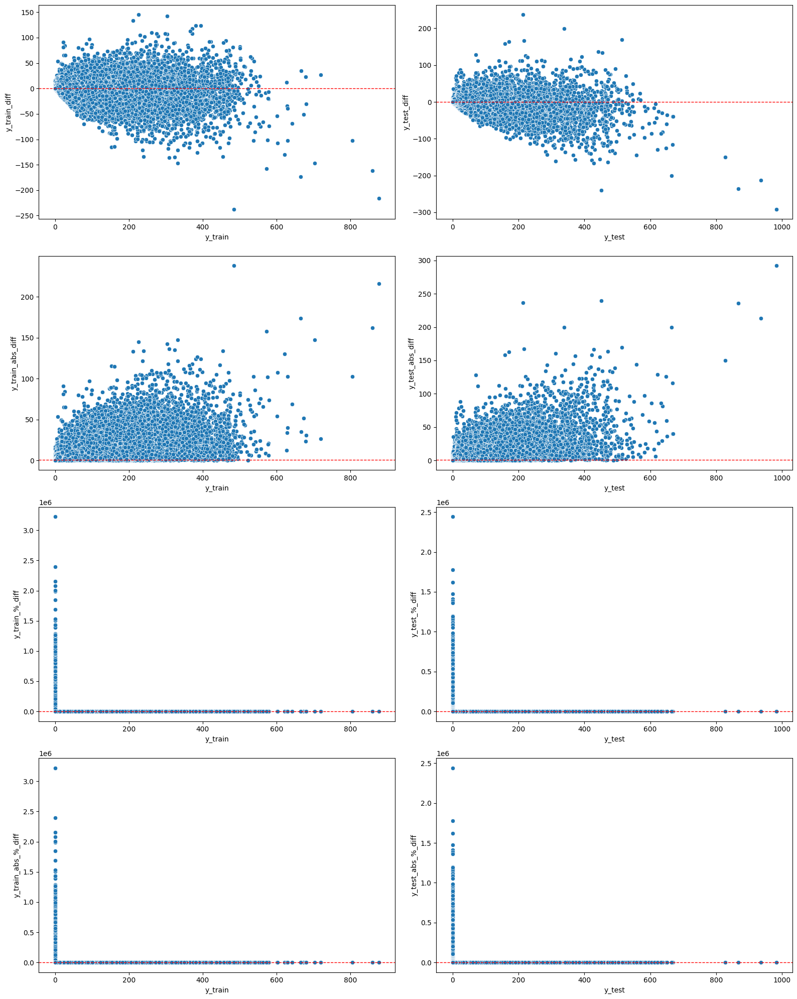

In [33]:
# Lists
df_list = [train_error_analysis_df, test_error_analysis_df]
ys_list = ['diff', 'abs_diff', '%_diff', 'abs_%_diff']
sets_list = ['train', 'test']

# Plot
fig = scatter_error_analysis(
    df_list,
    ys_list,
    sets_list
)

# Log
mlflow.log_figure(
    fig,
    "error_analysis/obs/charts/y_vs_all_diffs.png"
)

# Show
plt.show()

##### Absolute diff.(s) vs. label (zoomed)

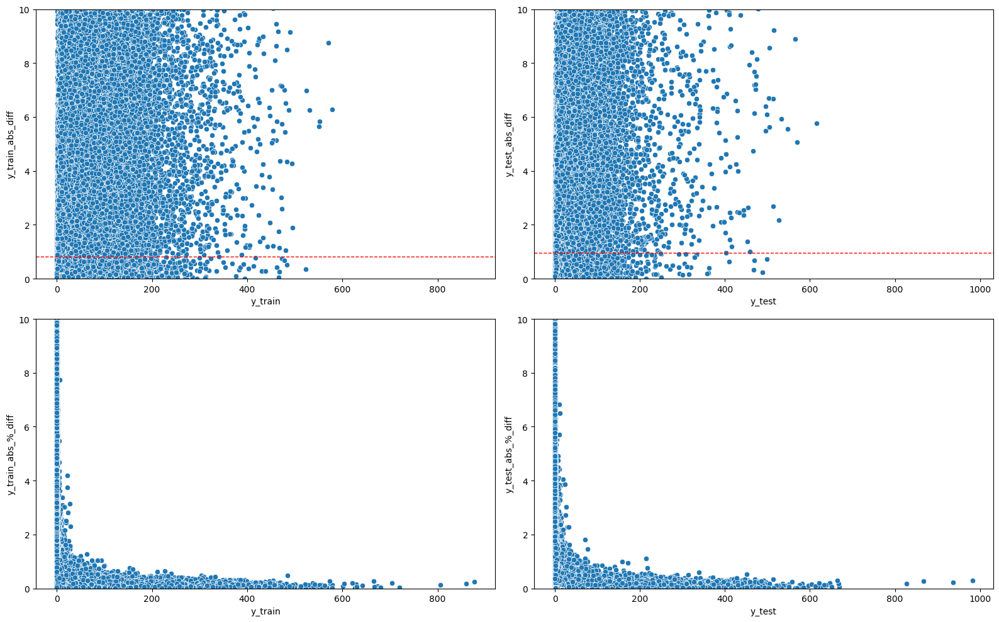

In [34]:
# Lists
df_list = [train_error_analysis_df, test_error_analysis_df]
ys_list = ['abs_diff', 'abs_%_diff']
sets_list = ['train', 'test']

# Focus
y_min = 0
y_max = 10

# Plot
fig = scatter_error_analysis(
    df_list,
    ys_list,
    sets_list,
    y_min=y_min,
    y_max=y_max
)

# Log
mlflow.log_figure(
    fig,
    f"error_analysis/obs/charts/y_vs_abs_diffs_{y_min}_{y_max}.png"
)

# Show
fig.show()

#### Residuals histogram

##### All differences

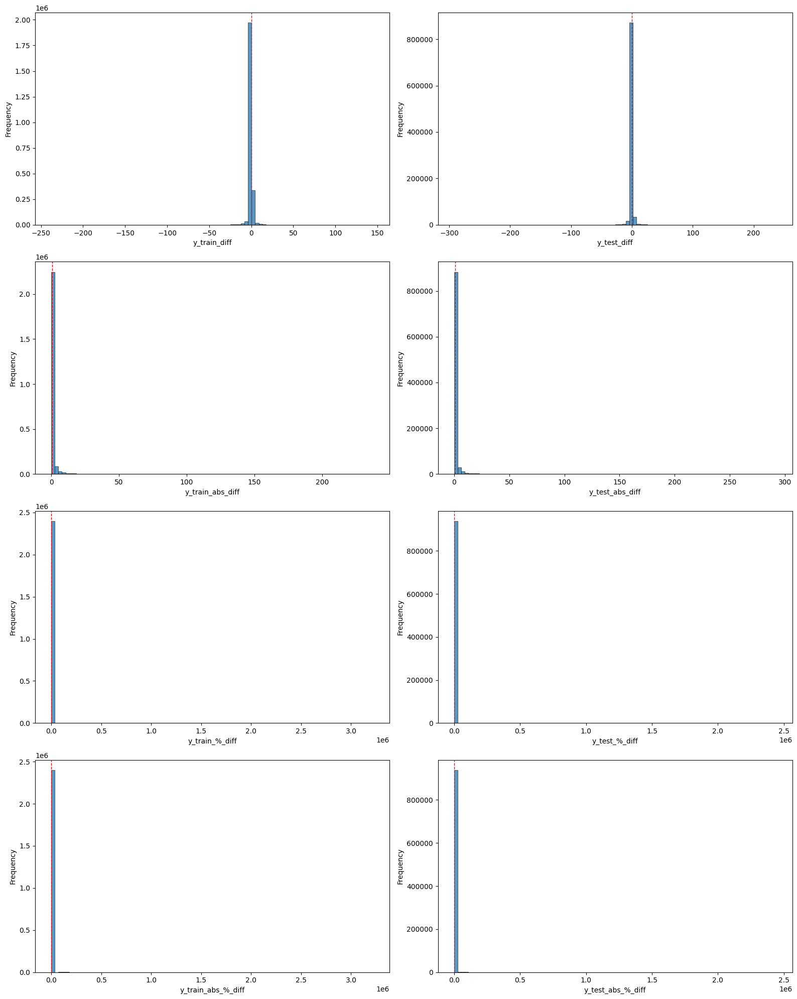

In [35]:
# Lists
df_list = [train_error_analysis_df, test_error_analysis_df]
ys_list = ['diff', 'abs_diff', '%_diff', 'abs_%_diff']
sets_list = ['train', 'test']

# Plot
fig = hist_error_analysis(
    df_list,
    ys_list,
    sets_list,
    bins=90
)

# Log
mlflow.log_figure(
    fig,
    f"error_analysis/obs/charts/hist_all_diffs.png"
)

# Show
fig.show()

## Catchments-based

### Aggregation functions definitions

In [36]:
def get_combined_agg_funcs(set_name, df):

    # Function to calculate NSE
    def calculate_nse(group):
        return r2_score(group[f"y_{set_name}"], group[f"y_{set_name}_hat"])
    
    # Define the percentiles to calculate
    # 🚩 The way to name percentiles is set to be aligned with..
    #..general practice in the field 🚩  
    percentiles = {
        'percentile_95': 0.05,
        'percentile_70': 0.30,
        'percentile_10': 0.90,
        'percentile_5': 0.95
    }
    
    # Create the aggregation functions dynamically for both "y" and "y_hat"
    agg_funcs = {}
    for col in [f"y_{set_name}", f"y_{set_name}_hat"]:
        agg_funcs.update({
            f'{col}_median': (col, 'median'),
            f'{col}_avg': (col, 'mean'),
            **{f'{col}_{name}': (col, lambda x, q=q: x.quantile(q)) for name, q in percentiles.items()}
        })
    
    # Add additional aggregations
    additional_agg_funcs = {
        f"y_{set_name}_diff_avg": (f"y_{set_name}_diff", 'mean'),
        f"y_{set_name}_abs_diff_avg": (f"y_{set_name}_abs_diff", 'mean'),
        f"y_{set_name}_%_diff_avg": (f"y_{set_name}_%_diff", 'mean'),
        f"y_{set_name}_abs_%_diff_avg": (f"y_{set_name}_abs_%_diff", 'mean'),
        f"y_{set_name}_nse": ('catchmentID', lambda x: calculate_nse(df.loc[x.index])),
        'n_windows': (f"y_{set_name}", 'count')
    }
    
    # Combine agg_funcs and additional_agg_funcs
    combined_agg_funcs = {**additional_agg_funcs, **agg_funcs}

    return combined_agg_funcs

In [37]:
def get_catchments_grouped_by(
    group_by_lists,
    df,
    set_name
):

    # Define output
    results = []

    # Set aggregation function to use
    combined_agg_funcs = get_combined_agg_funcs(
        set_name,
        df
    )

    # Loop on group-by(s)
    for group_by_list in group_by_lists:

        # Initialize specific data frame
        curr_grouped_by_df = (
            df.groupby(
                group_by_list
            )
            .agg(**combined_agg_funcs)
            .sort_values(
                f"y_{set_name}_abs_%_diff_avg",
                ascending=True
            )
        )

        # Store the data frame
        results.append(curr_grouped_by_df)

    return tuple(results)

### Data frames creation

In [38]:
# Define group-by list of lists
group_by_lists = [
    ['catchmentID'],
    ['catchmentID', 'year']
]


# _______________________________
# Calculate grouped-by data frame

# Train
train_catchment_error_df, train_catchment_year_error_df = (
    get_catchments_grouped_by(
        group_by_lists,
        train_error_analysis_df,
        'train'
    )
)

# Test
test_catchment_error_df, test_catchment_year_error_df = (
    get_catchments_grouped_by(
        group_by_lists,
        test_error_analysis_df,
        'test'
    )
)


# _____________________________________________
# Calculate cumulated and normalized indicators
for df, set_name in [(train_catchment_error_df, 'train'), (test_catchment_error_df, 'test')]:    

    # Cumulated
    df[f"y_{set_name}_abs_%_diff_avg_cum"] = df[f"y_{set_name}_abs_%_diff_avg"].cumsum()
    df['n_windows_cum'] = df['n_windows'].cumsum()
    df['sample_percentage'] = (
        np.arange(1, df.shape[0] + 1) / 
            df.shape[0] 
                * 100
    )

    # Normalized the cumulative error per catchment
    df['mean_cum_percentage'] = (
        df[f"y_{set_name}_abs_%_diff_avg_cum"] / 
            df[f"y_{set_name}_abs_%_diff_avg_cum"].iloc[-1] # Max value
                * 100
    )

    # Normalize the cumulative number of windows per catchment
    df['n_windows_cum_percentage'] = (
        df['n_windows_cum'] / 
            df['n_windows_cum'].iloc[-1] # Max value
                * 100
    )

# ____
# Save
train_catchment_error_df.to_csv(
    os.path.join(
        temp_files_dir,
        "train_catchment_error_df.csv"
    )
)

train_catchment_year_error_df.to_csv(
    os.path.join(
        temp_files_dir,
        "train_catchment_year_error_df.csv"
    )
)

test_catchment_error_df.to_csv(
    os.path.join(
        temp_files_dir,
        "test_catchment_error_df.csv"
    )
)

test_catchment_year_error_df.to_csv(
    os.path.join(
        temp_files_dir,
        "test_catchment_year_error_df.csv"
    )
)


# ____
# Log

for csv_file in [
    "train_catchment_error_df.csv",
    "train_catchment_year_error_df.csv",
    "test_catchment_error_df.csv",
    "test_catchment_year_error_df.csv"
]:

    mlflow.log_artifact(
        os.path.join(
            temp_files_dir,
            csv_file
        ),
        "error_analysis/catchment/tables"
    )

In [39]:
display(train_catchment_error_df.head(3))
display(test_catchment_error_df.head(3))

,y_train_diff_avg,y_train_abs_diff_avg,y_train_%_diff_avg,y_train_abs_%_diff_avg,y_train_nse,n_windows,y_train_median,y_train_avg,y_train_percentile_95,y_train_percentile_70,y_train_percentile_10,y_train_percentile_5,y_train_hat_median,y_train_hat_avg,y_train_hat_percentile_95,y_train_hat_percentile_70,y_train_hat_percentile_10,y_train_hat_percentile_5,y_train_abs_%_diff_avg_cum,n_windows_cum,sample_percentage,mean_cum_percentage,n_windows_cum_percentage
catchmentID,,,,,,,,,,,,,,,,,,,,,,,
28009,0.641,6.243,0.020,0.075,0.980,7519,57.874,84.279,27.507,40.796,178.589,242.707,59.414,84.920,27.422,42.176,177.436,236.844,0.075,7519,0.244,0.000,0.313
28022,1.049,6.924,0.026,0.078,0.975,7414,63.414,90.472,27.869,45.161,188.251,253.129,64.698,91.521,29.405,46.218,189.910,253.093,0.153,14933,0.489,0.000,0.621
54095,-1.953,5.460,-0.003,0.097,0.975,7177,32.807,58.641,11.640,19.727,144.996,200.751,33.218,56.688,11.378,19.972,136.300,186.980,0.250,22110,0.733,0.000,0.920


,y_test_diff_avg,y_test_abs_diff_avg,y_test_%_diff_avg,y_test_abs_%_diff_avg,y_test_nse,n_windows,y_test_median,y_test_avg,y_test_percentile_95,y_test_percentile_70,y_test_percentile_10,y_test_percentile_5,y_test_hat_median,y_test_hat_avg,y_test_hat_percentile_95,y_test_hat_percentile_70,y_test_hat_percentile_10,y_test_hat_percentile_5,y_test_abs_%_diff_avg_cum,n_windows_cum,sample_percentage,mean_cum_percentage,n_windows_cum_percentage
catchmentID,,,,,,,,,,,,,,,,,,,,,,,
28009,-0.331,7.190,0.013,0.083,0.965,3143,54.386,82.641,26.897,39.420,173.279,246.073,55.866,82.310,27.455,40.042,168.887,233.234,0.083,3143,0.244,0.000,0.334
28022,0.611,6.951,0.022,0.084,0.973,3083,55.387,81.217,28.136,41.791,160.831,230.536,57.036,81.829,28.974,42.837,162.790,225.313,0.167,6226,0.489,0.000,0.662
27079,-1.459,2.771,-0.008,0.102,0.947,1389,15.891,24.576,6.664,10.694,50.695,69.476,15.288,23.117,7.345,11.018,45.504,64.095,0.269,7615,0.733,0.000,0.810


### Log catchments metrics

In [40]:
catchments_metrics = {
    'catch_train_mean:avg_MAE': train_catchment_error_df['y_train_abs_diff_avg'].mean(),
    'catch_train_mean:avg_MAPE': train_catchment_error_df['y_train_abs_%_diff_avg'].mean(),
    'catch_train_mean:avg_NSE': train_catchment_error_df['y_train_nse'].mean(),

    'catch_test_mean:avg_MAE': test_catchment_error_df['y_test_abs_diff_avg'].mean(),
    'catch_test_mean:avg_MAPE': test_catchment_error_df['y_test_abs_%_diff_avg'].mean(),
    'catch_test_mean:avg_NSE': test_catchment_error_df['y_test_nse'].mean(),
}

pprint(catchments_metrics)

mlflow.log_metrics(catchments_metrics)

{'catch_test_mean:avg_MAE': 0.9060993378856071,
 'catch_test_mean:avg_MAPE': 380.52694842553973,
 'catch_test_mean:avg_NSE': 0.6358798603604697,
 'catch_train_mean:avg_MAE': 0.7854889243942492,
 'catch_train_mean:avg_MAPE': 404.9977572654454,
 'catch_train_mean:avg_NSE': 0.6768085538307977}


### Problematic catchment(s)

#### Gini's index on errors

In [41]:
y_train_abs_diff_avg_gini = gini(train_catchment_error_df['y_train_abs_diff_avg'].values)
y_test_abs_diff_avg_gini = gini(test_catchment_error_df['y_test_abs_diff_avg'].values)

y_train_abs_perc_diff_avg_gini = gini(train_catchment_error_df['y_train_abs_%_diff_avg'].values)
y_test_abs_perc_diff_avg_gini = gini(test_catchment_error_df['y_test_abs_%_diff_avg'].values)


print("Gini's index for train absolute diff. average for catchments:\t" +
      f"{y_train_abs_diff_avg_gini:.4f}")
print("Gini's index for test absolute diff. average for catchments:\t" +
      f"{y_test_abs_diff_avg_gini:.4f}")

print("Gini's index for train absolute % diff. average for catchments:\t" +
      f"{y_train_abs_perc_diff_avg_gini:.4f}")
print("Gini's index for test absolute % diff. average for catchments:\t" +
      f"{y_test_abs_perc_diff_avg_gini:.4f}")


# Log
mlflow.log_metrics(
    {
        'catch_train_gini:avg_MAE': y_train_abs_diff_avg_gini,
        'catch_test_gini:avg_MAE': y_test_abs_diff_avg_gini,
        'catch_train_gini:avg_MAPE': y_train_abs_perc_diff_avg_gini,
        'catch_test_gini:avg_MAPE': y_test_abs_perc_diff_avg_gini,
    }
)

Gini's index for train absolute diff. average for catchments:	0.6288
Gini's index for test absolute diff. average for catchments:	0.6503
Gini's index for train absolute % diff. average for catchments:	0.9906
Gini's index for test absolute % diff. average for catchments:	0.9913


#### Identification

In [42]:
def identify_right_tail_catchments(df):
    
    # Difference in the cumulated normalized error line
    delta_mean_cum_percentage = df['mean_cum_percentage'].diff()

    # Retrieve list of catchments where the slope is >= 45 degrees
    right_tail_catchments = (
        df[delta_mean_cum_percentage >= 1 / (df.shape[0] - 1)]
        .index
        .to_list()
    )

    return right_tail_catchments


# ________________________________
# Calculate right tail catchments
train_right_tail_catchments = identify_right_tail_catchments(train_catchment_error_df)
test_right_tail_catchments = identify_right_tail_catchments(test_catchment_error_df)


# ________________
# Derive the quote
train_right_tail_catchments_quote = (
    len(train_right_tail_catchments) / train_catchment_error_df.shape[0]
)
test_right_tail_catchments_quote = (
    len(test_right_tail_catchments) / test_catchment_error_df.shape[0]
)


# ________________________________
# Add boolean column on data frame
train_catchment_error_df['RightTailCatchments'] = (
    train_catchment_error_df.index.isin(train_right_tail_catchments)
)
test_catchment_error_df['RightTailCatchments'] = (
    test_catchment_error_df.index.isin(test_right_tail_catchments)
)


# ___
# Log
for list_name in ['train_right_tail_catchments', 'test_right_tail_catchments']:
    temp_file = os.path.join(
        temp_files_dir,
        f"{list_name}.json"
    )

    # Dump the data to a JSON file
    with open(temp_file, 'w') as file:
        json.dump(globals()[list_name], file)

    # Log as artifact
    mlflow.log_artifact(
        temp_file,
        "error_analysis/catchment"
    )

### Viz

#### NSE

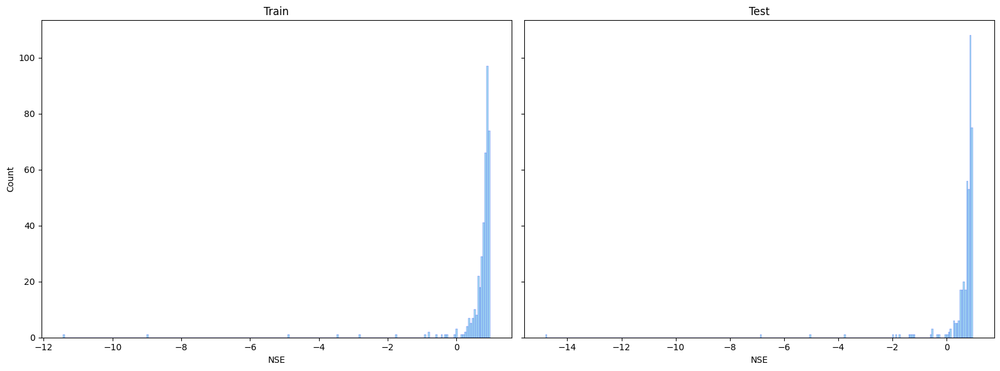

In [43]:
# Create a figure with 1 row and 2 columns, sharing the y-axis
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Data and titles for the subplots
datasets = [
    (train_catchment_error_df, 'train'),
    (test_catchment_error_df, 'test')
]

# Plot NSE density for both datasets
for ax, (data, set_name) in zip(axes, datasets):
    sns.histplot(
        data=data,
        x=f"y_{set_name}_nse",
        color='skyblue',
        edgecolor='blue',
        ax=ax
    )
    ax.set_title(f"{set_name.capitalize()}")
    ax.set_xlabel(f"NSE")

# Adjust layout
plt.tight_layout()

# Log
mlflow.log_figure(
    fig,
    "error_analysis/catchment/charts/nse.png"
)

# Show
plt.show()

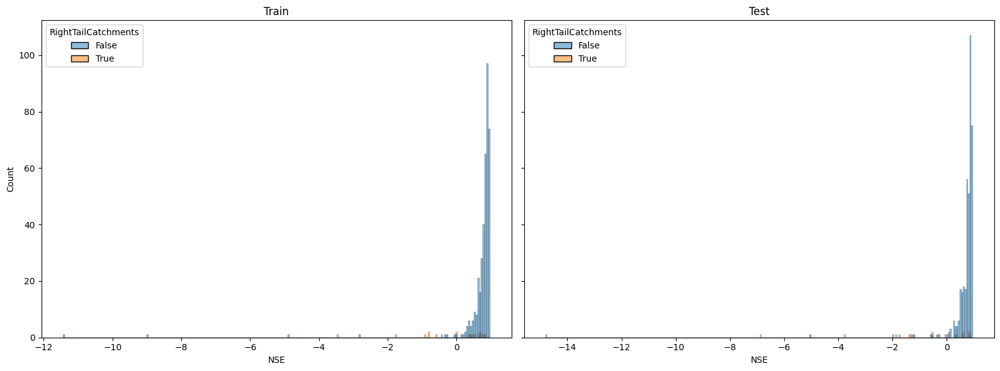

In [44]:
# Create a figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Data and titles for the subplots
datasets = [
    (train_catchment_error_df, 'train'),
    (test_catchment_error_df, 'test')
]

# Plot R² for both datasets
for ax, (data, set_name) in zip(axes, datasets):
    sns.histplot(
        data=data,
        x=f"y_{set_name}_nse",
        hue='RightTailCatchments',
        ax=ax,
        kde=False
    )
    ax.set_title(f"{set_name.capitalize()}")
    ax.set_xlabel(f"NSE")

# Adjust layout
plt.tight_layout()

# Log
mlflow.log_figure(
    fig,
    "error_analysis/catchment/charts/nse_plob_split.png"
)

# Show
plt.show()

#### Venn graphs

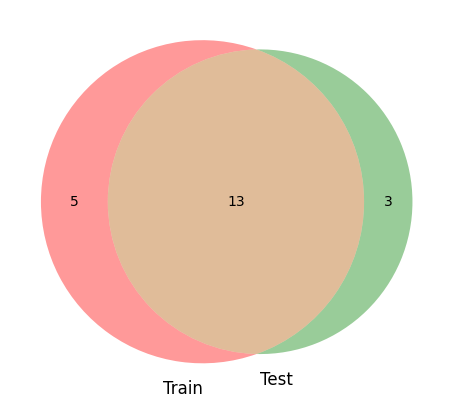

In [45]:
# Example sets
train_right_tail_catchments_set = set(train_right_tail_catchments)
test_right_tail_catchments_set = set(test_right_tail_catchments)

# Create a Venn diagram for two sets
fig = plt.figure(figsize=(10, 5))
venn2(
    [train_right_tail_catchments_set, test_right_tail_catchments_set],
    ('Train', 'Test')
)

# Log
mlflow.log_figure(
    fig,
    "error_analysis/catchment/charts/venn_graph_train-test.png"
)

# Show
plt.show()

#### Errors concentration

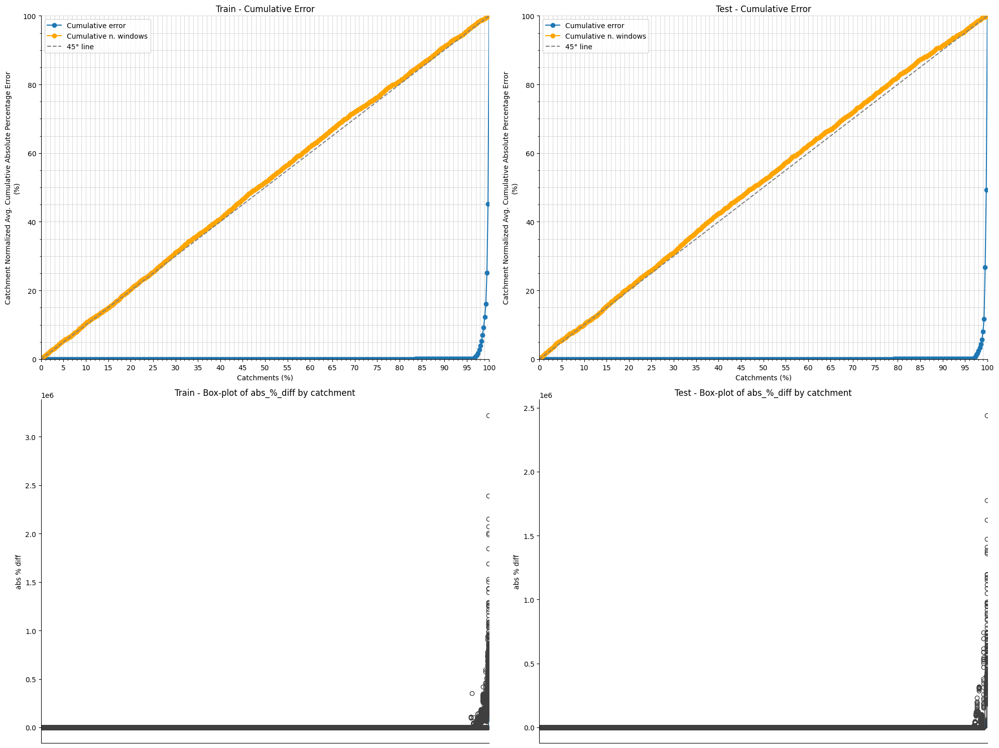

In [46]:
# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# Data and titles for the subplots
datasets = [
    (train_catchment_error_df, train_error_analysis_df, 'Train'),
    (test_catchment_error_df, test_error_analysis_df, 'Test')
]

# Plot cumulative error curves and box plots for both datasets
for col, (catchment_df, error_df, set_name) in enumerate(datasets):
    # Plot the cumulative error curve in the first subplot
    axes[0, col].plot(
        catchment_df['sample_percentage'], catchment_df['mean_cum_percentage'],
        marker='o', linestyle='-', label='Cumulative error'
    )
    axes[0, col].plot(
        catchment_df['sample_percentage'], catchment_df['n_windows_cum_percentage'],
        marker='o', linestyle='-', color='orange', label='Cumulative n. windows'
    )
    axes[0, col].plot(
        [0, 100], [0, 100], linestyle='--', color='grey', label='45° line'
    )
    axes[0, col].set_title(f"{set_name} - Cumulative Error")
    axes[0, col].set_xlabel('Catchments (%)')
    axes[0, col].set_ylabel('Catchment Normalized Avg. Cumulative Absolute Percentage Error\n(%)')
    axes[0, col].legend()
    axes[0, col].grid(which='both', linestyle='--', linewidth=0.5)
    axes[0, col].minorticks_on()
    # Set axis limits to exactly 0 to 100
    axes[0, col].set_xlim(0, 100)
    axes[0, col].set_ylim(0, 100)
    # Set more granular x-axis labels
    axes[0, col].set_xticks(np.arange(0, 101, 5))
    # Remove the top and right spines
    axes[0, col].spines['top'].set_visible(False)
    axes[0, col].spines['right'].set_visible(False)

    # Plot the box plot in the second subplot
    sns.boxplot(
        x='catchmentID', y=f"y_{set_name.lower()}_abs_%_diff",
        order=catchment_df.index, data=error_df, ax=axes[1, col]
    )
    axes[1, col].set_title(f"{set_name} - Box-plot of abs_%_diff by catchment")
    axes[1, col].set_xlabel('CatchmentID')
    axes[1, col].set_ylabel('abs % diff')
    # Remove the top and right spines
    axes[1, col].spines['top'].set_visible(False)
    axes[1, col].spines['right'].set_visible(False)
    # Remove x-axis ticks and label
    axes[1, col].set_xticks([])
    axes[1, col].set_xlabel('')

# Adjust layout and show the plot
plt.subplots_adjust(hspace=0.5)
plt.tight_layout()

# Log
mlflow.log_figure(
    fig,
    "error_analysis/catchment/charts/errors_concentration.png"
)

# Show
plt.show()

#### Add geo locations

In [47]:
# Define a function to merge and sort the data
def merge_and_sort(gdf_catchments, catchment_error_df, set_name):
    columns = [
        f'y_{set_name.lower()}_diff_avg',
        f'y_{set_name.lower()}_abs_diff_avg',
        f'y_{set_name.lower()}_%_diff_avg',
        f'y_{set_name.lower()}_abs_%_diff_avg',
        f'y_{set_name.lower()}_nse',
    ]
    merged_df = (
        gdf_catchments
            .merge(
                catchment_error_df[columns],
                left_on='ID_STRING',
                right_index=True,
                how='right'
            )
            .sort_values(columns, ascending=False)
    )
    assert merged_df.isna().sum().sum() == 0, "Some unexpected NaN"
    return merged_df

# Merge and sort for train set
train_gdf_catchments_merged = merge_and_sort(gdf_catchments, train_catchment_error_df, 'Train')

# Merge and sort for test set
test_gdf_catchments_merged = merge_and_sort(gdf_catchments, test_catchment_error_df, 'Test')

# Display the results
display(train_gdf_catchments_merged.head(3))
display(test_gdf_catchments_merged.head(3))

,ID_STRING,ID,SOURCE,VERSION,EXPORTED,catchment_geom,area_sqkm,gauge_lat,gauge_lon,river,location,flow-gauging-station_geom,benchmark_catch,chalk_stream_flag,y_train_diff_avg,y_train_abs_diff_avg,y_train_%_diff_avg,y_train_abs_%_diff_avg,y_train_nse
113,27003,27003.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((453025 425525, 453025 425500, 453125...",1935.968,53.720,-1.200,Aire,Beal Weir,POINT (452889.488 425140.294),N,False,1.155,3.710,0.063,0.132,0.961
438,53018,53018.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((378525 167025, 378550 167025, 378625...",1569.351,51.400,-2.310,Avon,Bathford,POINT (378530.97 166819.901),N,False,1.111,2.685,0.169,0.230,0.970
152,28022,28022.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((480475 360525, 480475 360425, 480450...",8209.420,53.140,-0.800,Trent,North Muskham,POINT (480369.735 360988.883),N,False,1.049,6.924,0.026,0.078,0.975


,ID_STRING,ID,SOURCE,VERSION,EXPORTED,catchment_geom,area_sqkm,gauge_lat,gauge_lon,river,location,flow-gauging-station_geom,benchmark_catch,chalk_stream_flag,y_test_diff_avg,y_test_abs_diff_avg,y_test_%_diff_avg,y_test_abs_%_diff_avg,y_test_nse
270,39001,39001.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((517750 169875, 517800 169875, 517825...",9930.829,51.420,-0.310,Thames,Kingston,POINT (517609.069 170353.078),N,True,2.304,8.682,0.237,0.362,0.945
439,53022,53022.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((373825 165150, 373825 165200, 373875...",1621.884,51.380,-2.380,Avon,Bath ultrasonic,POINT (373649.794 164618.555),N,False,1.354,3.326,0.042,0.146,0.954
462,54029,54029.000,National River Flow Archive,1.3,2018-02-12,"POLYGON ((373450 255725, 373400 255725, 373375...",1483.656,52.200,-2.390,Teme,Knightsford Bridge,POINT (373441.944 255823.856),N,False,1.193,2.522,0.150,0.225,0.948


##### Area

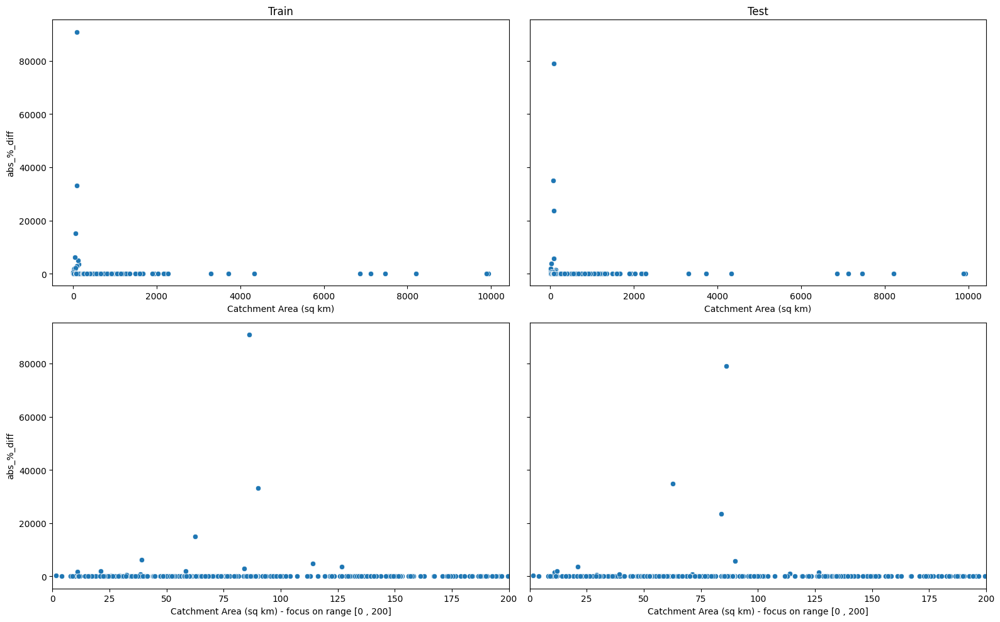

In [48]:
# Set x_min and x_max
x_min = 0
x_max = 200

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharey=True)

# Data and titles for the subplots
datasets = [
    (train_gdf_catchments_merged, 'y_train_abs_%_diff_avg', 'Train'),
    (test_gdf_catchments_merged, 'y_test_abs_%_diff_avg', 'Test')
]

# Plot scatter plots without limits in the first row
for ax, (data, y_column, title) in zip(axes[0], datasets):
    sns.scatterplot(data=data, x='area_sqkm', y=y_column, ax=ax)
    ax.set_xlabel("Catchment Area (sq km)")
    ax.set_ylabel("abs_%_diff")
    ax.set_title(f'{title}')

# Plot scatter plots with limits in the second row
for ax, (data, y_column, title) in zip(axes[1], datasets):
    sns.scatterplot(data=data, x='area_sqkm', y=y_column, ax=ax)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel(f"Catchment Area (sq km) - focus on range [{x_min} , {x_max}]")
    ax.set_ylabel("abs_%_diff")

# Adjust layout
plt.tight_layout()

# Log
mlflow.log_figure(
    fig,
    "error_analysis/catchment/charts/area_vs_abs_diffs_small_&_area_focus.png"
)

# Show
plt.show()

##### Error plotted on map

In [49]:
def get_norm(metric, vmin, vmax):

    if metric in ['diff_avg', '%_diff_avg', 'nse']:
        norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
    else:
        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    return norm

def get_error_map(
    train_gdf,
    test_gdf,
    metric_name,
    cmap,
    stadiamaps_provider,
    filter_train=None,
    filter_test=None
):
    
    # Define column names based on the pattern
    y_train_col = f'y_train_{metric_name}'
    y_test_col = f'y_test_{metric_name}'

    # Get colour map object
    cmap = plt.get_cmap(cmap)
    
    # Apply the colormap to the error metric columns for train and test data
    train_color = train_gdf[y_train_col].apply(lambda x: mcolors.to_hex(cmap(x)))
    test_color = test_gdf[y_test_col].apply(lambda x: mcolors.to_hex(cmap(x)))

    # Create a figure with 2 rows and 1 column
    fig, axes = plt.subplots(1, 2, figsize=(10, 20))

    # Apply filters if provided
    if filter_train is not None:
        train_gdf_queried = train_gdf.query(filter_train)
        train_color = train_color.loc[train_gdf_queried.index]
    else:
        train_gdf_queried = train_gdf
    if filter_test is not None:
        test_gdf_queried = test_gdf.query(filter_test)
        test_color = test_color.loc[test_gdf_queried.index]
    else:
        test_gdf_queried = test_gdf

    # Plot for train data
    geo_plot_basic(train_gdf_queried, stadiamaps_provider, ax=axes[0], color=train_color)
    axes[0].set_title('Train')
    axes[0].set_xlabel(metric_name)

    # Plot for test data
    geo_plot_basic(test_gdf_queried, stadiamaps_provider, ax=axes[1], color=test_color)
    axes[1].set_title('Test')
    axes[1].set_xlabel(metric_name)

    # Create ScalarMappable for train data
    norm_train = get_norm(metric_name, train_gdf[y_train_col].min(), train_gdf[y_train_col].max())
    sm_train = plt.cm.ScalarMappable(cmap=cmap, norm=norm_train)
    sm_train.set_array([])
    # sm_train.set_clim(train_gdf_queried[y_train_col].min(), train_gdf_queried[y_train_col].max())

    # Create ScalarMappable for test data
    norm_test = get_norm(metric_name, test_gdf[y_test_col].min(), test_gdf[y_test_col].max())
    sm_test = plt.cm.ScalarMappable(cmap=cmap, norm=norm_test)
    sm_test.set_array([])
    # sm_test.set_clim(test_gdf_queried[y_test_col].min(), test_gdf_queried[y_test_col].max())
    

    # Add the colorbar to the plot as a legend for train data
    cbar_train = fig.colorbar(sm_train, ax=axes[0], orientation='horizontal', fraction=0.01, pad=0.015)
    # cbar_train.ax.set_ylim(
    #     train_gdf_queried[y_train_col].min(),
    #     train_gdf_queried[y_train_col].max()
    # )

    # Add the colorbar to the plot as a legend for test data
    cbar_test = fig.colorbar(sm_test, ax=axes[1], orientation='horizontal', fraction=0.01, pad=0.015)
    # cbar_test.ax.set_ylim(
    #     test_gdf_queried[y_test_col].min(),
    #     test_gdf_queried[y_test_col].max()
    # )

    # Adjust layout and show the plot
    plt.tight_layout()
    
    return fig

In [50]:
# Set variables and cmap
vars_plotted_on_map = [
    ('diff_avg', 'coolwarm_r'),
    ('abs_diff_avg', 'Reds'),
    ('%_diff_avg', 'coolwarm_r'),
    ('abs_%_diff_avg', 'Reds'),
    ('nse', 'RdYlGn')
]

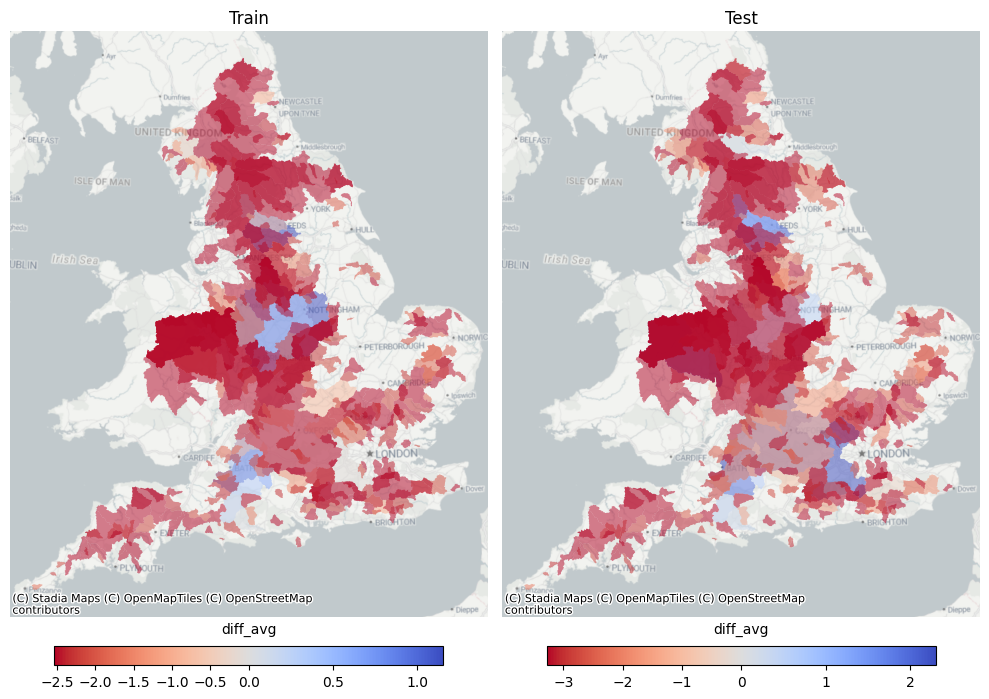

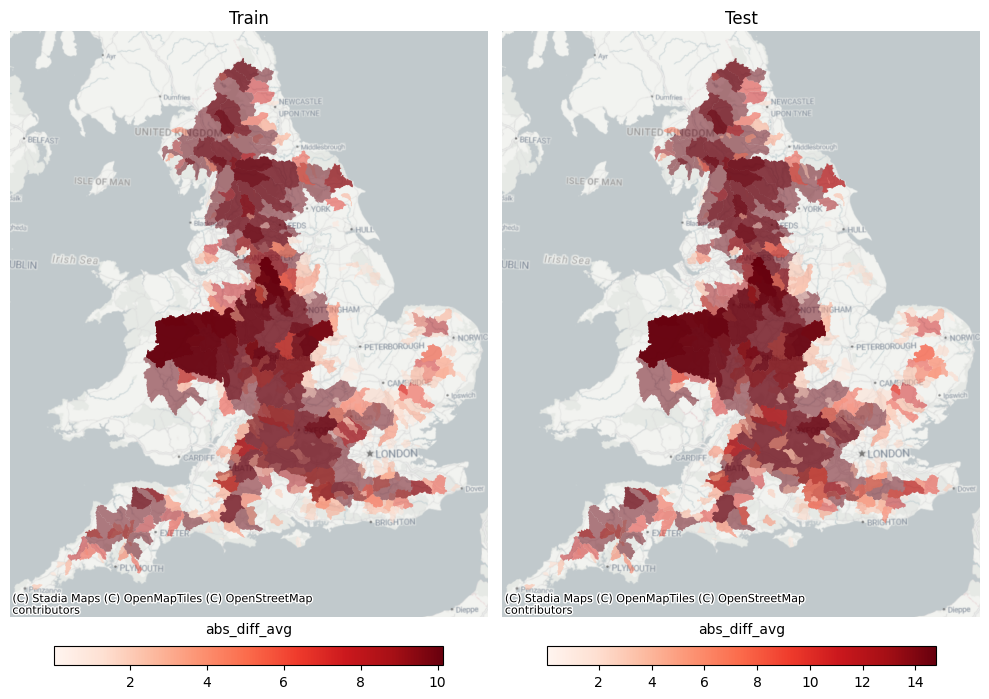

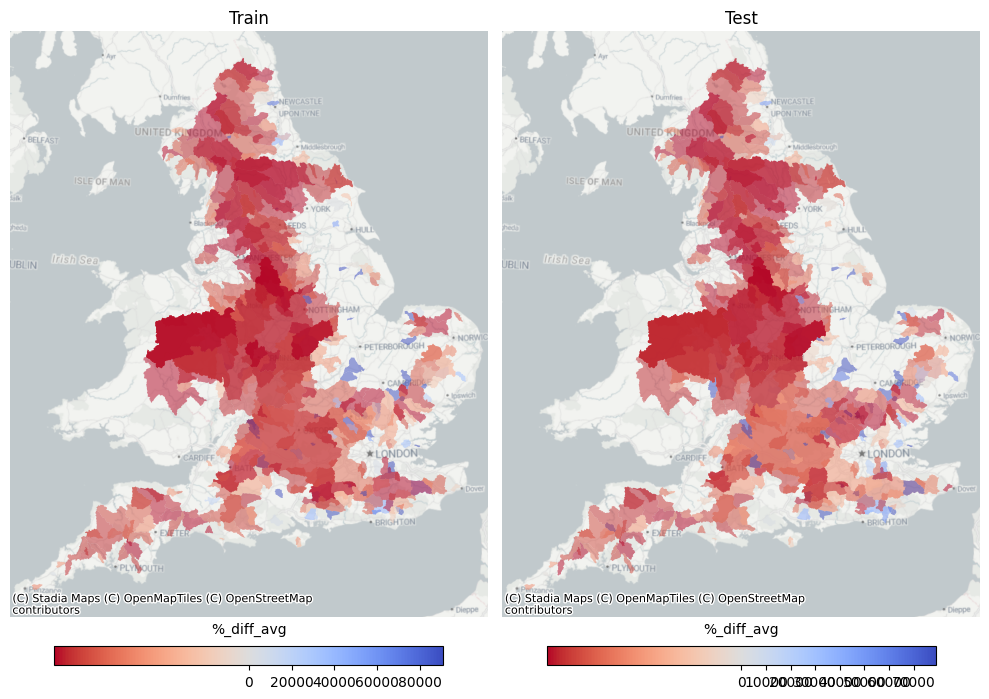

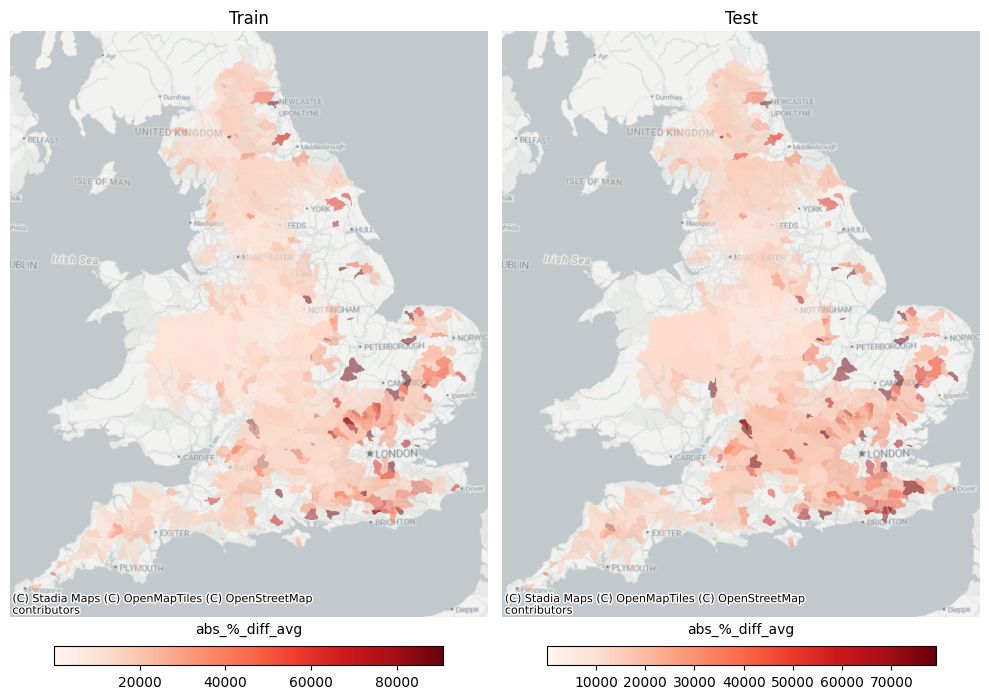

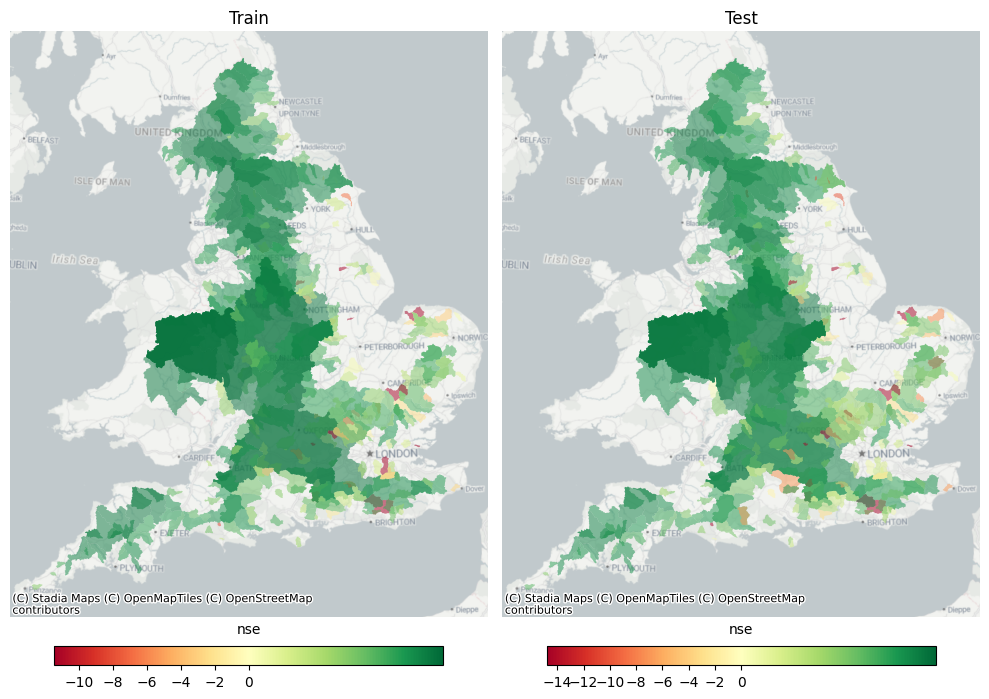

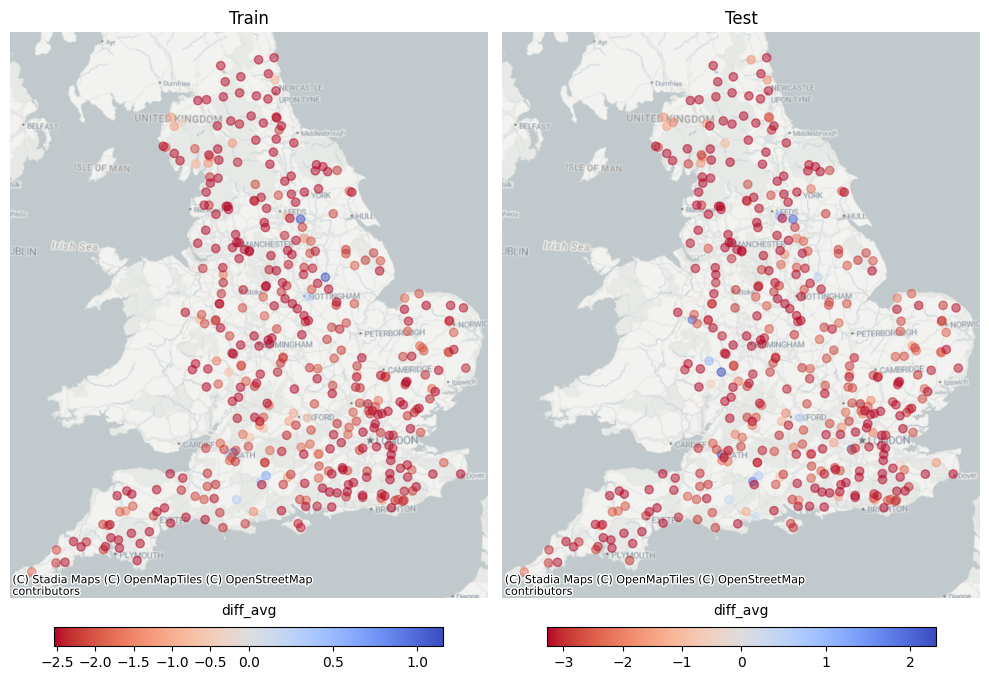

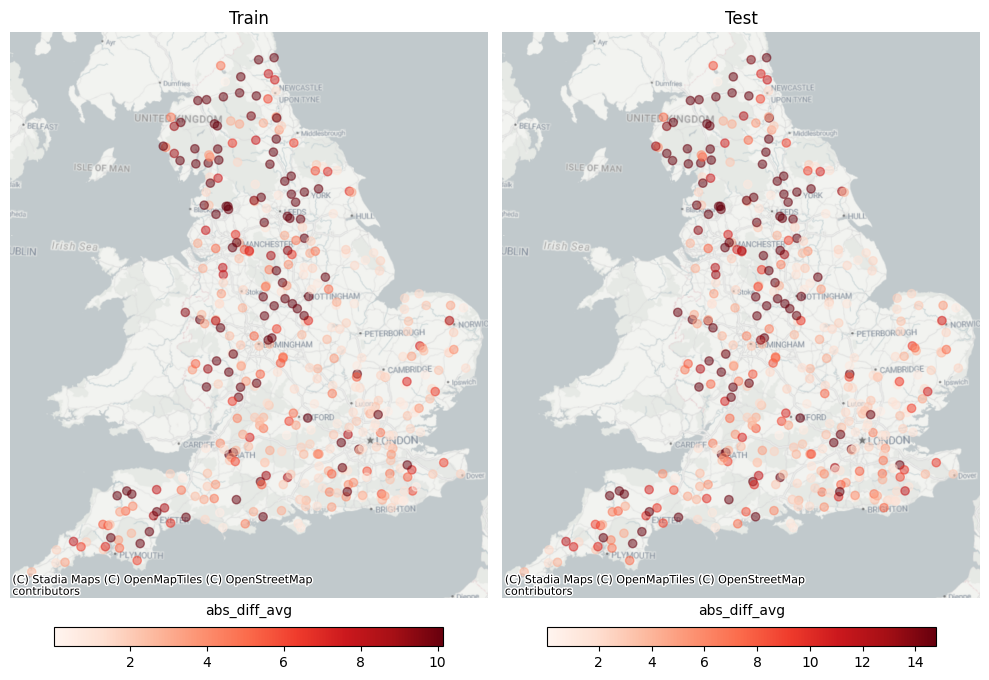

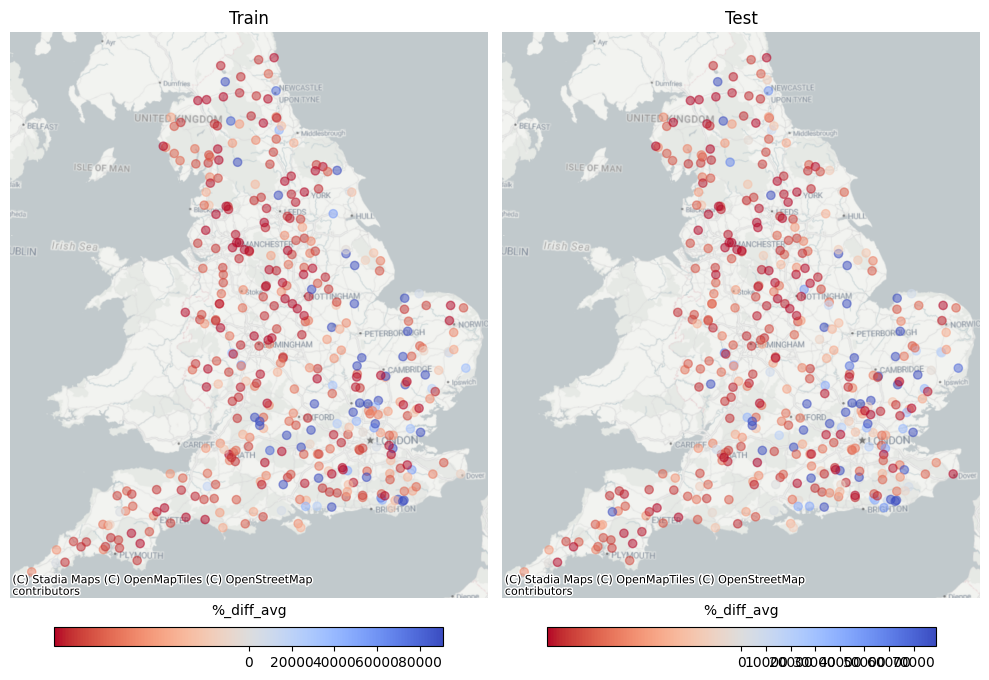

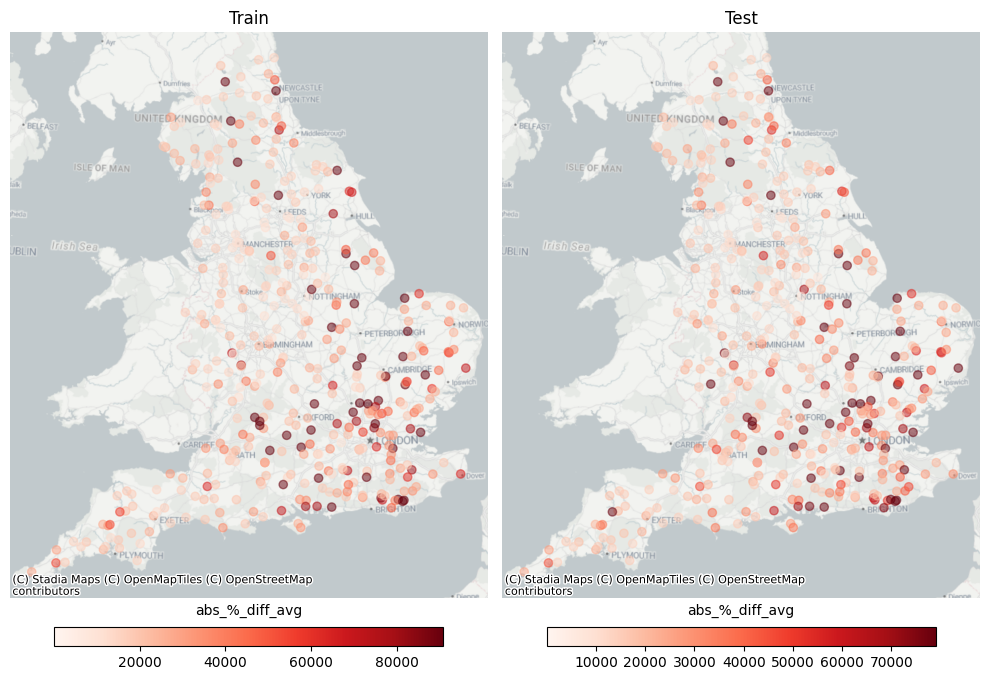

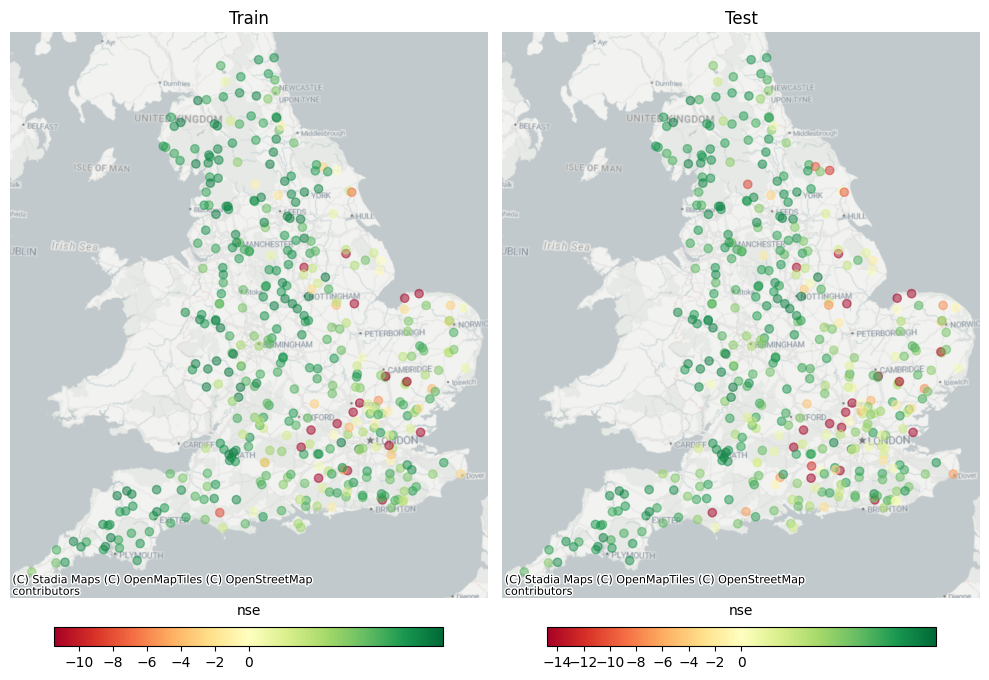

In [51]:
# ALL CATCHMENTS IN SAMPLE

for geometry in ['catchment_geom', 'flow-gauging-station_geom']:

    # Set geometry
    (
        train_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )
    
    (
        test_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )

    for var, cmap in vars_plotted_on_map:
        
        # Get plot
        fig = get_error_map(
            train_gdf_catchments_merged,
            test_gdf_catchments_merged,
            var,
            cmap,
            stadiamaps_provider,
        )
    
        # Log
        mlflow.log_figure(
            fig,
            f"error_analysis/catchment/charts/errors_map_{var}_{geometry}_all_sample.png",
            save_kwargs={'bbox_inches': 'tight'}
        )
    
        # Show
        plt.show()

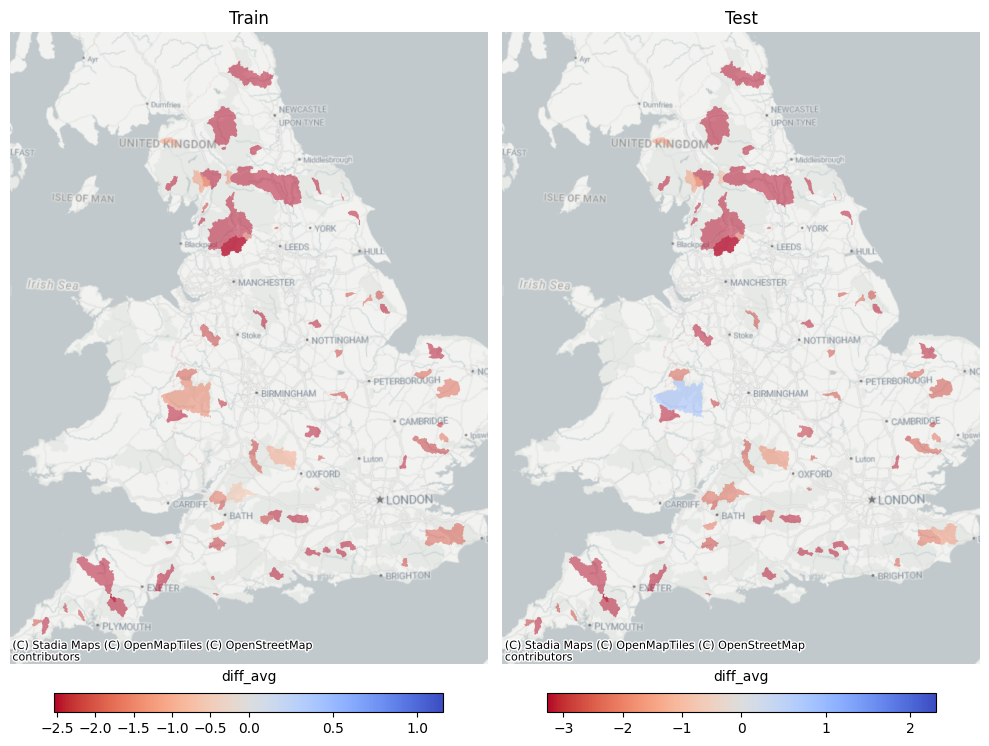

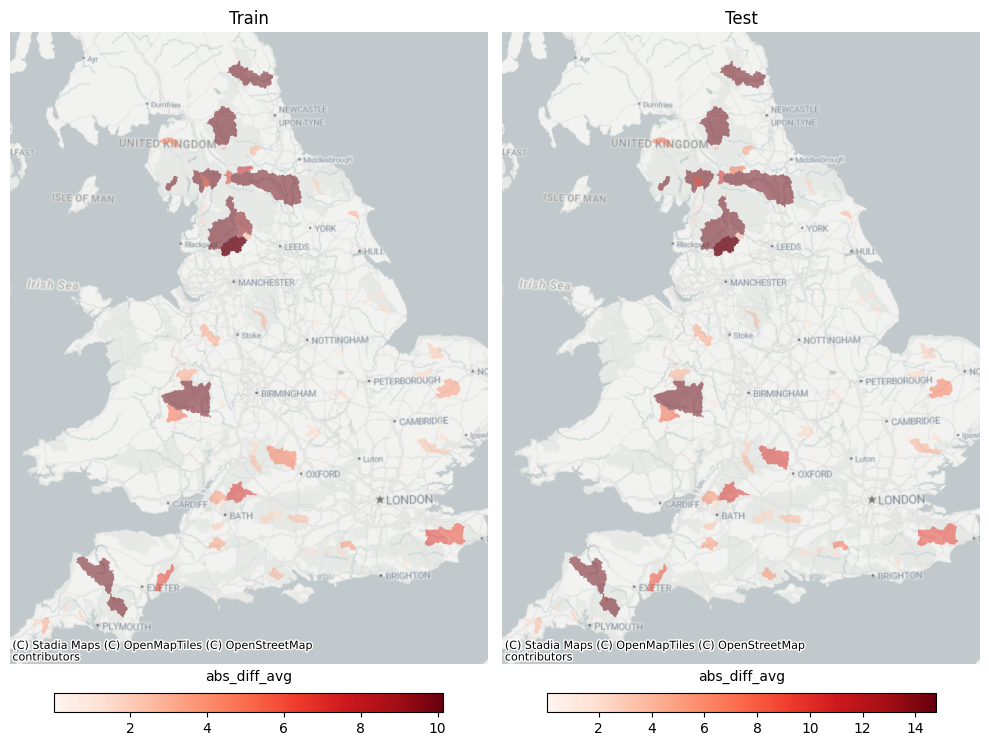

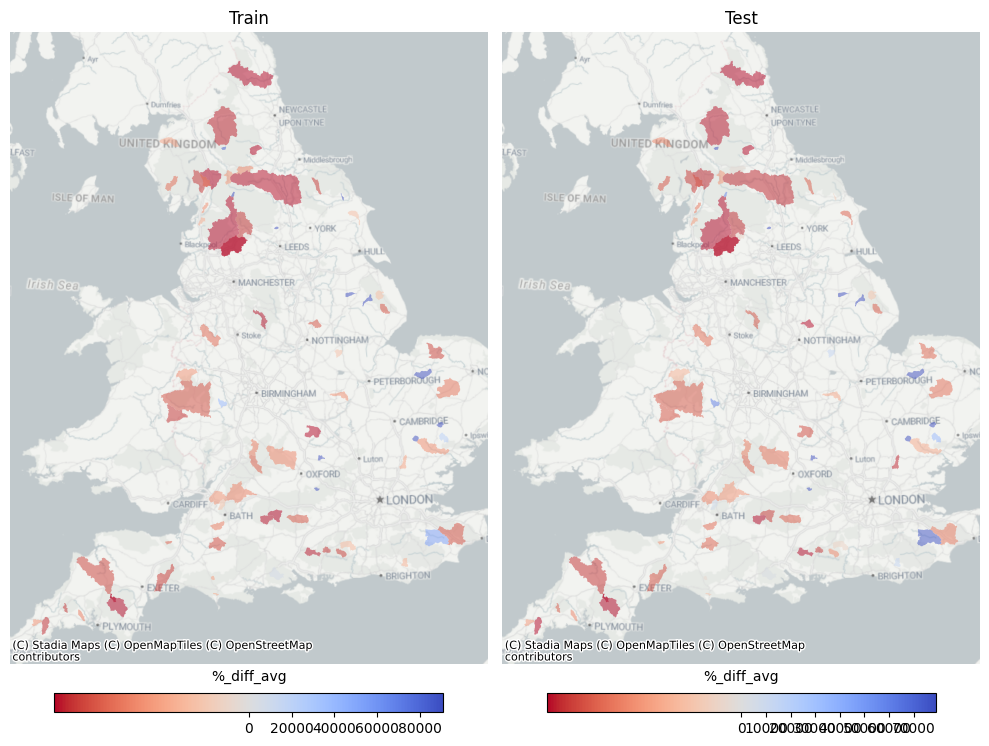

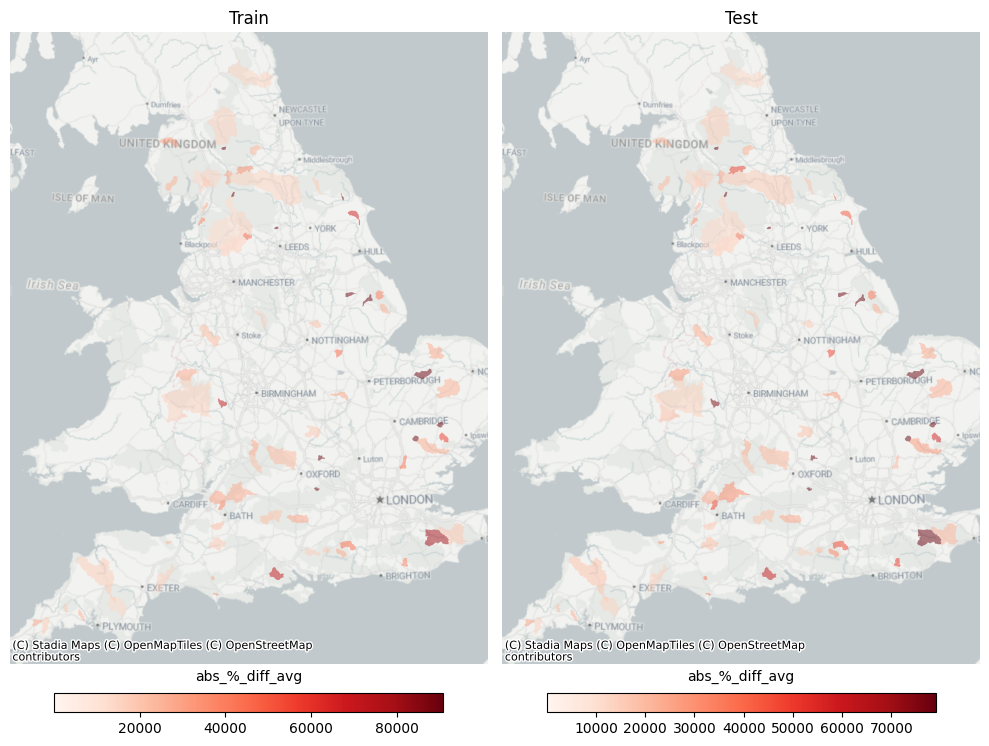

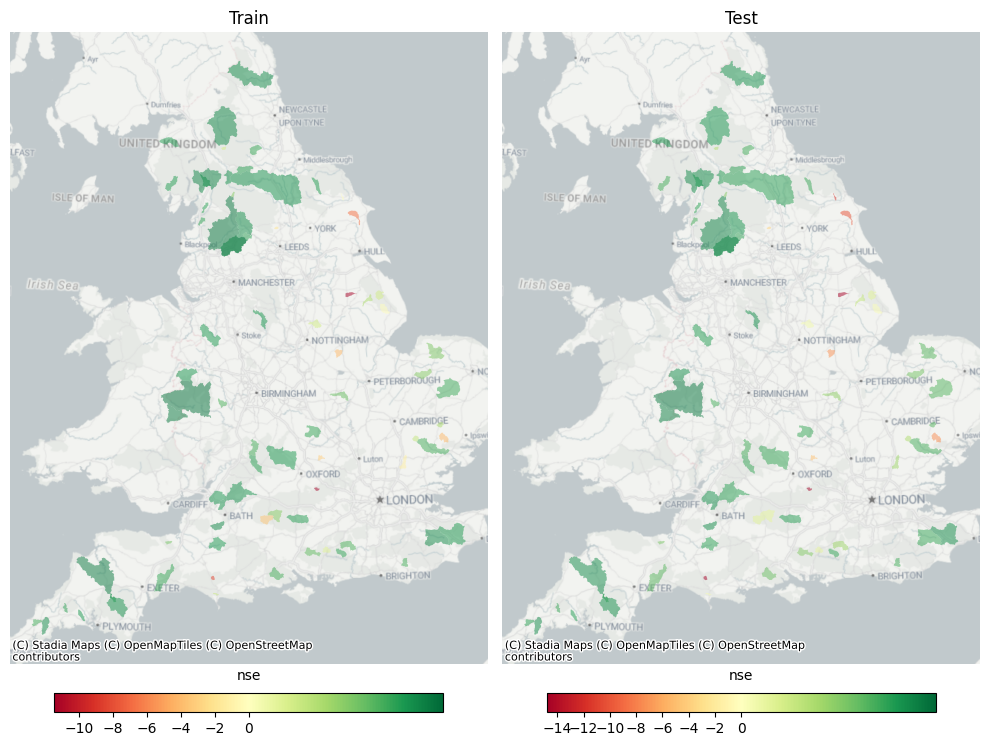

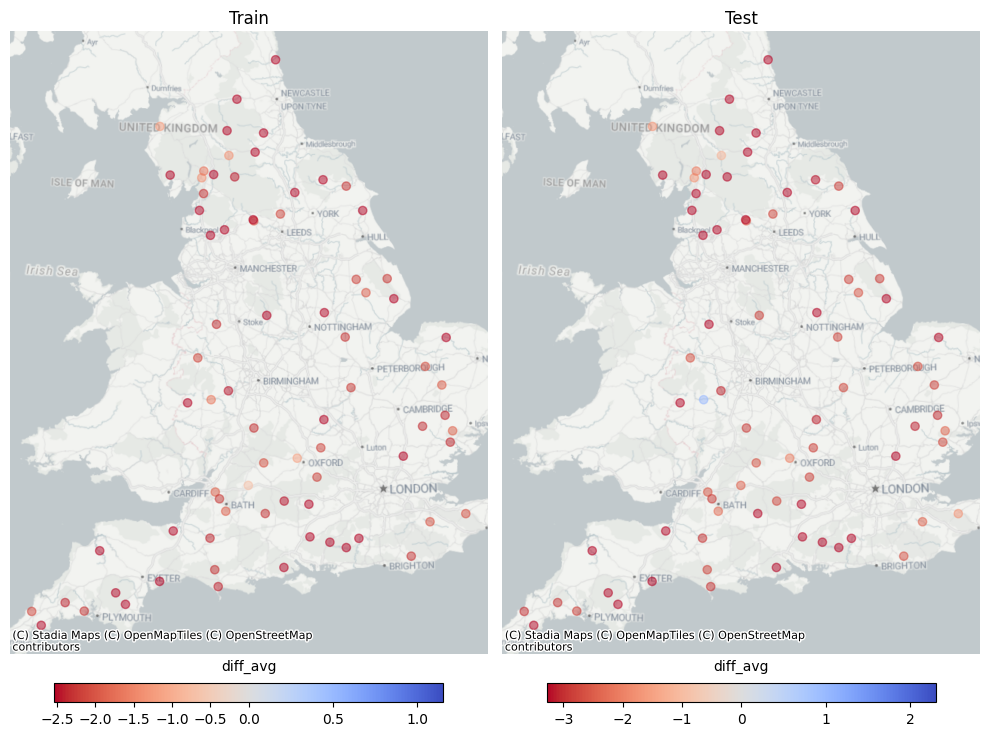

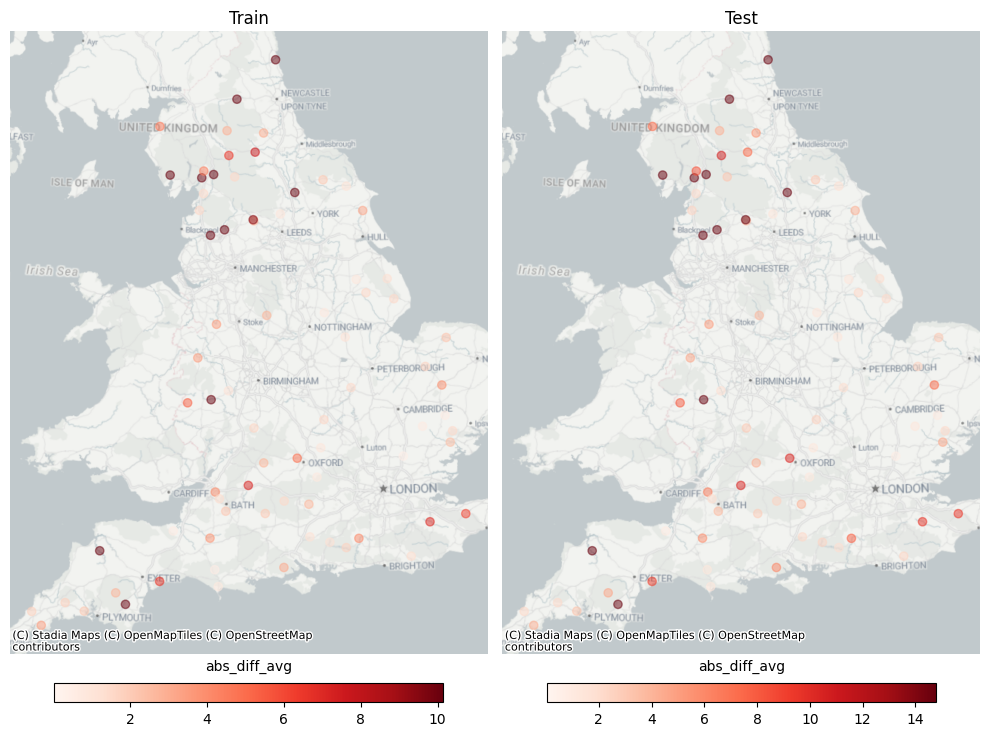

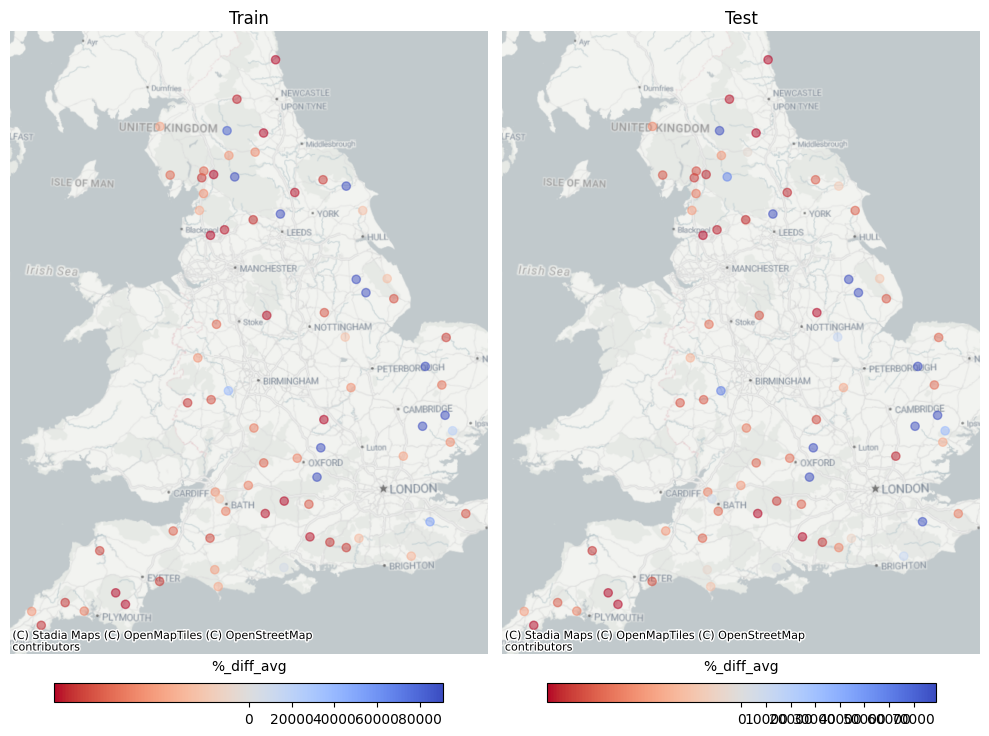

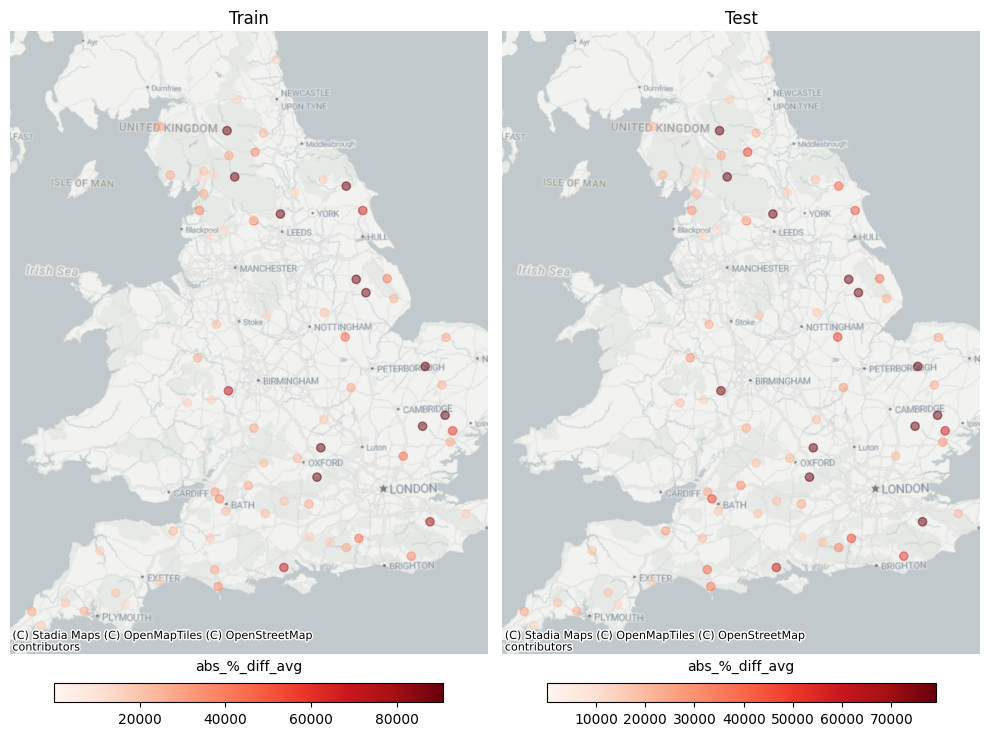

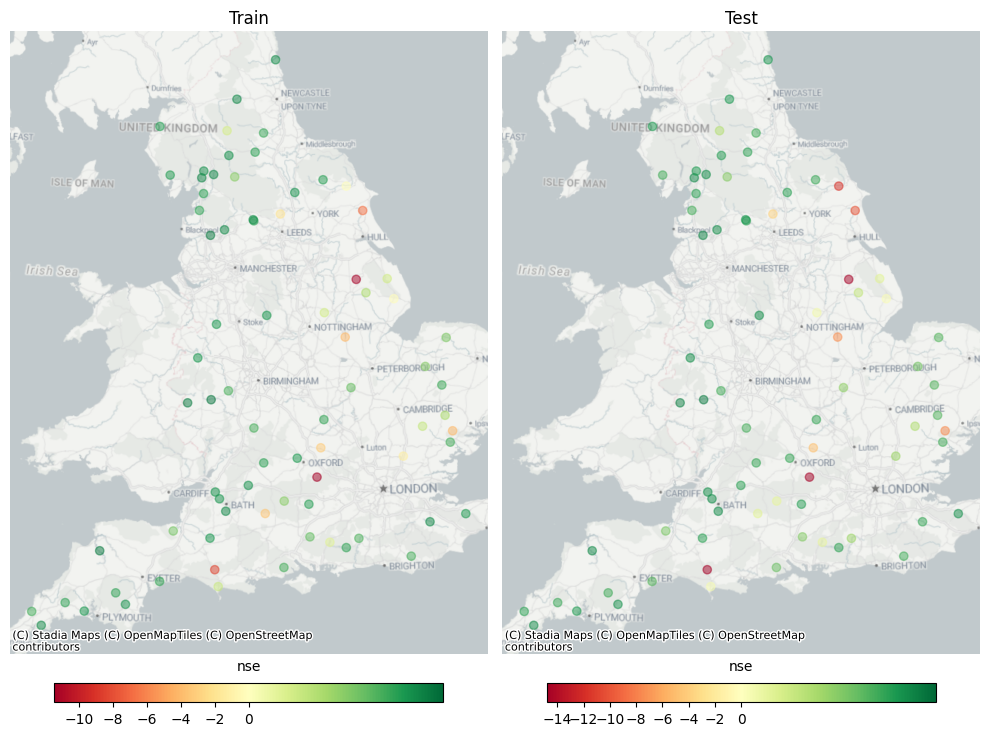

In [52]:
# BENCHMARK CATCHMENTS (in sample)
for geometry in ['catchment_geom', 'flow-gauging-station_geom']:

    # Set geometry
    (
        train_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )
    
    (
        test_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )
    
    for var, cmap in vars_plotted_on_map:
        
        # Get plot
        fig = get_error_map(
            train_gdf_catchments_merged,
            test_gdf_catchments_merged,
            var,
            cmap,
            stadiamaps_provider,
            filter_train='benchmark_catch == "Y"',
            filter_test='benchmark_catch == "Y"'
        )
    
        # Log
        mlflow.log_figure(
            fig,
            f"error_analysis/catchment/charts/errors_map_{var}_{geometry}_uk_benchmark.png"
        )
    
        # Show
        plt.show()

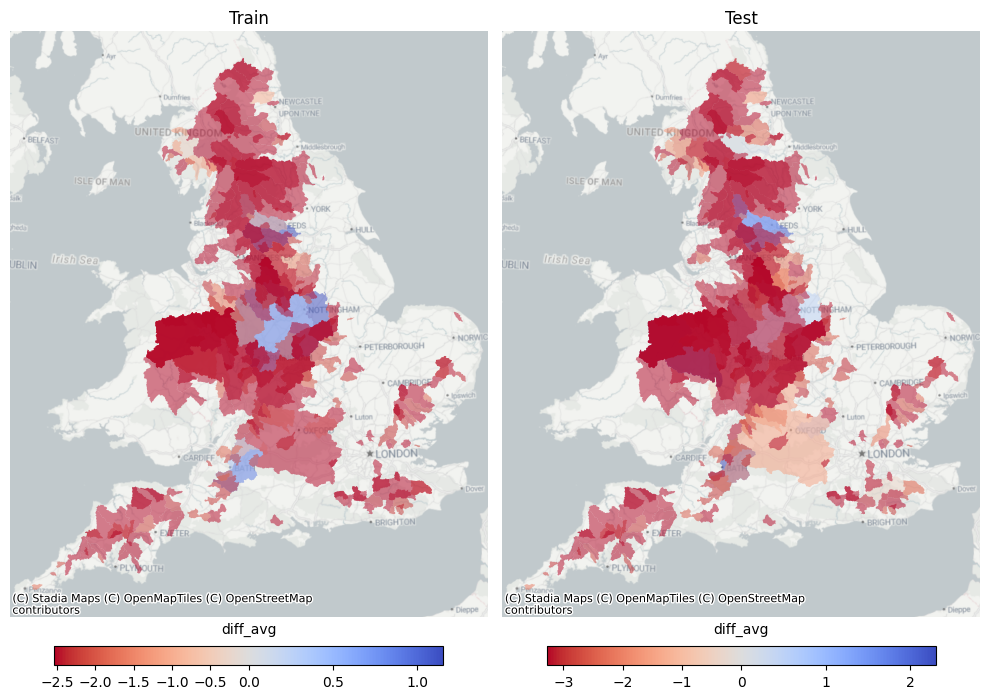

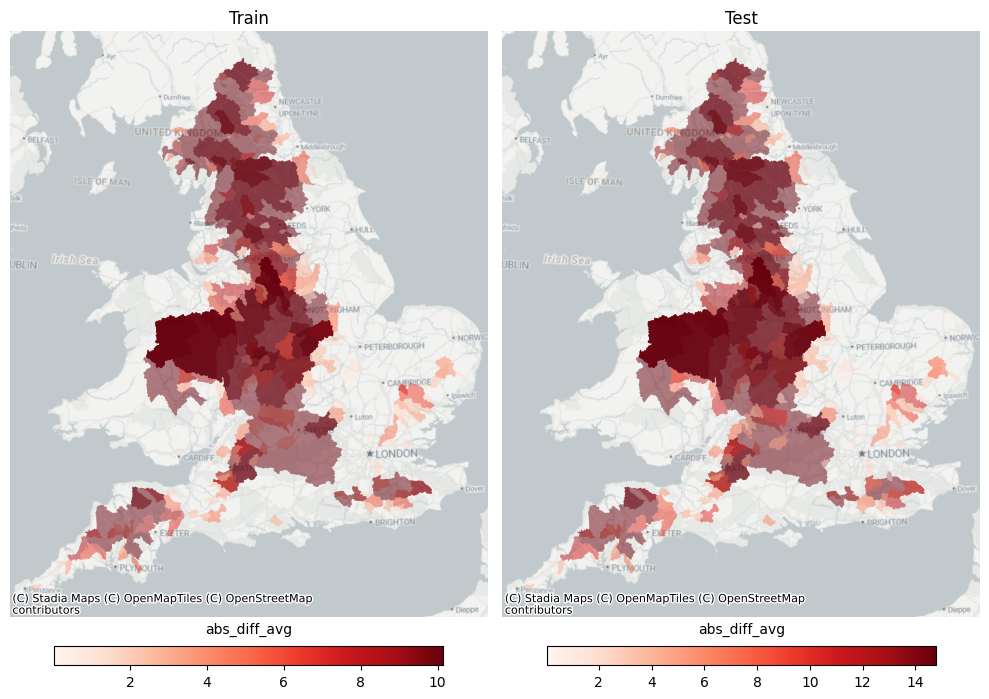

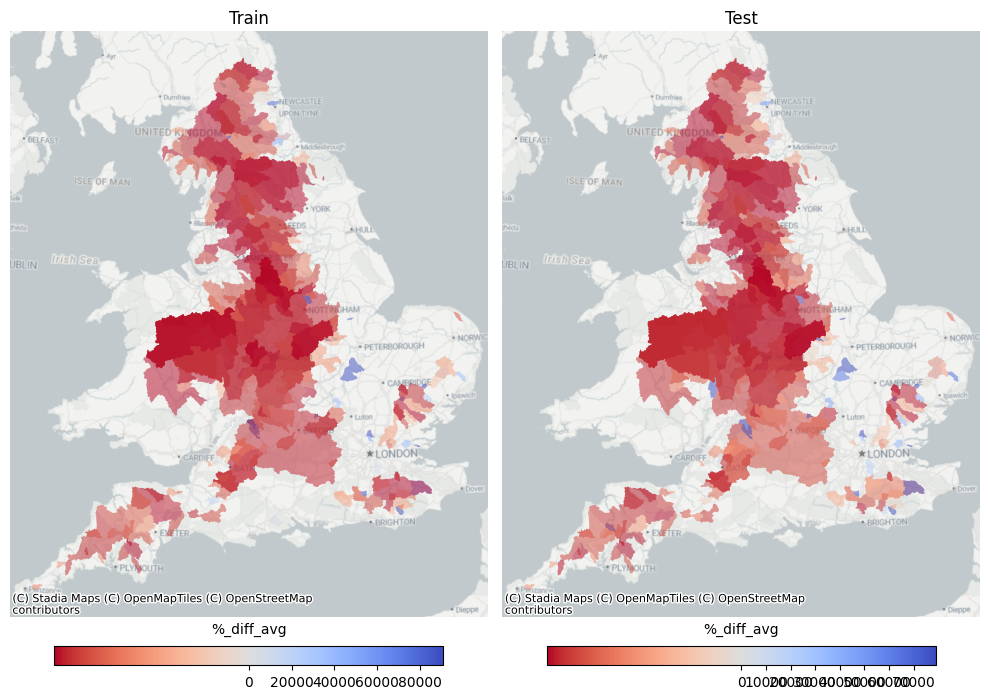

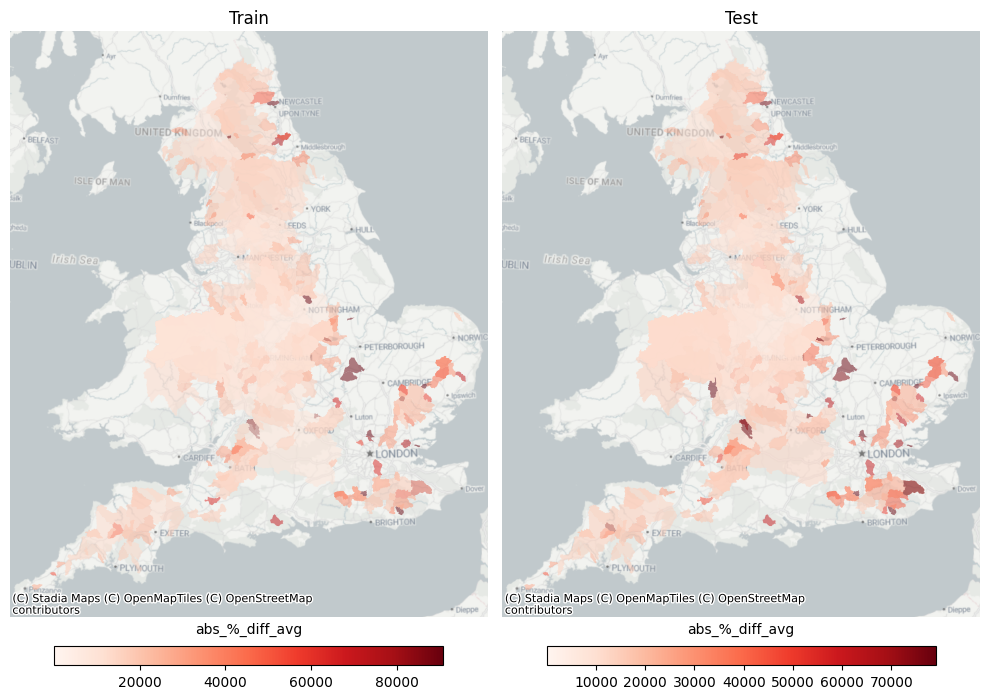

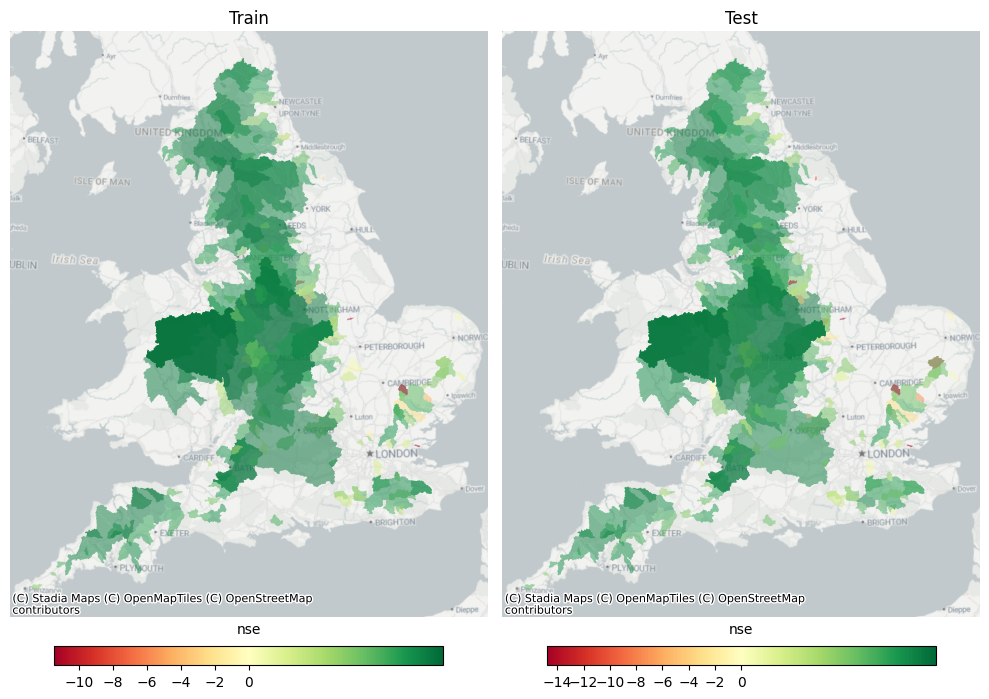

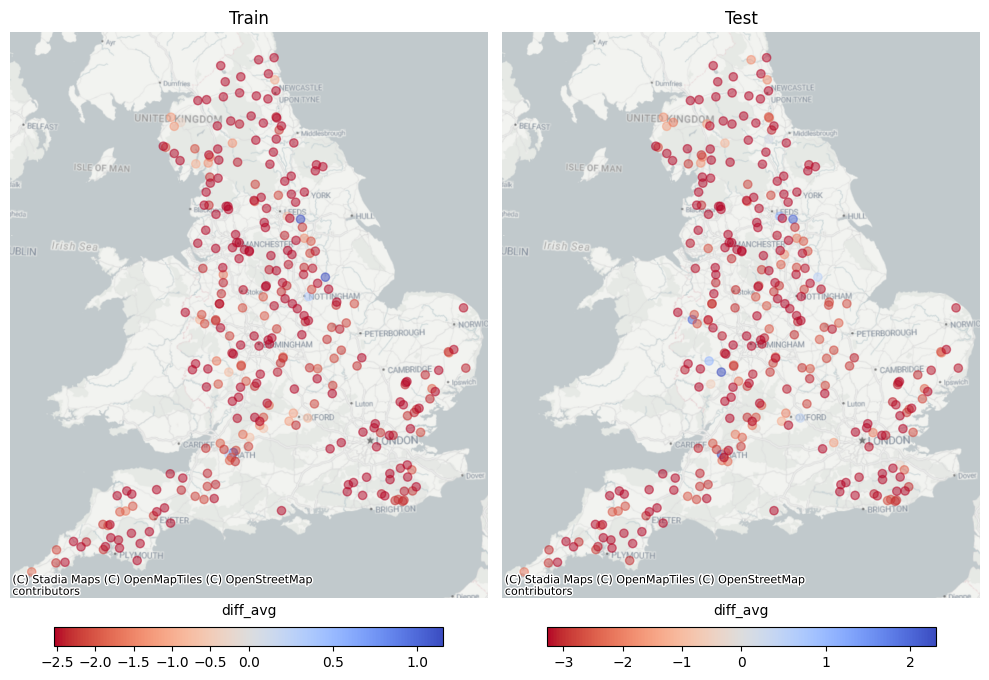

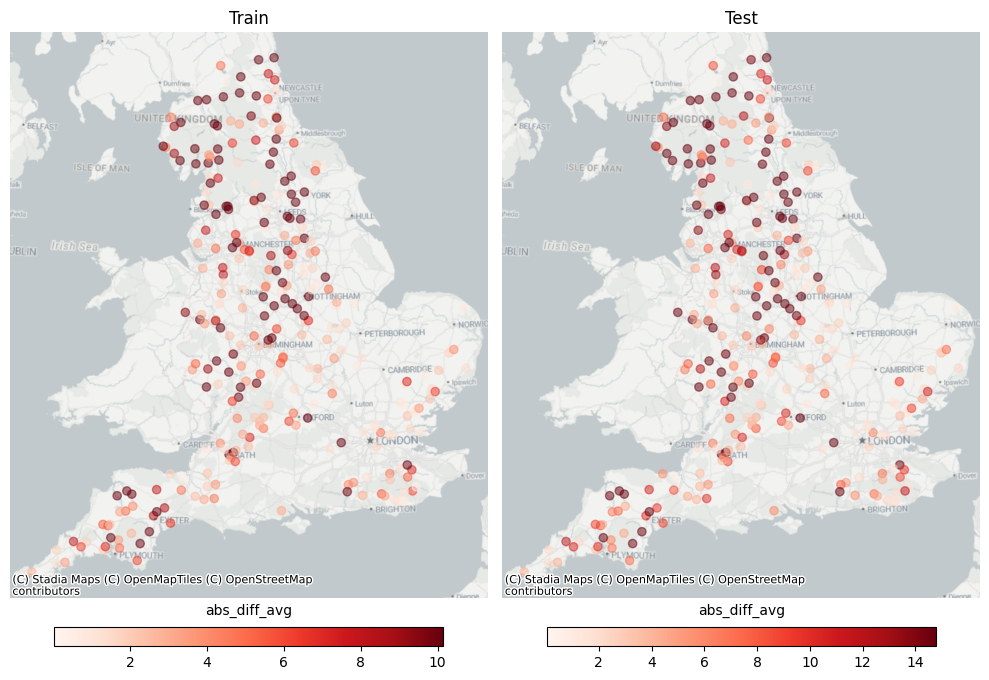

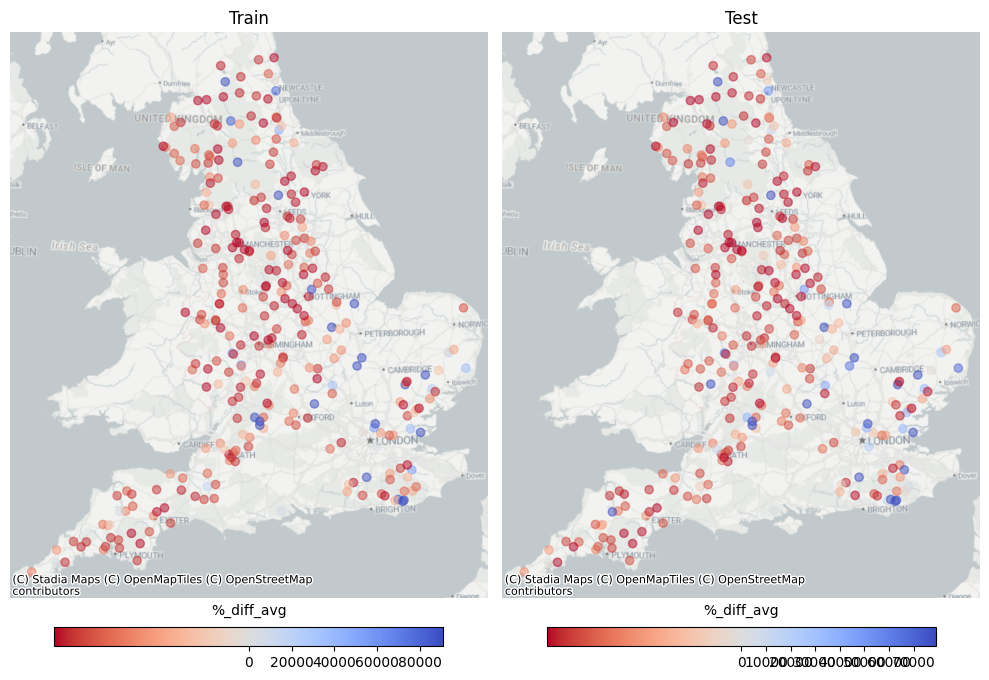

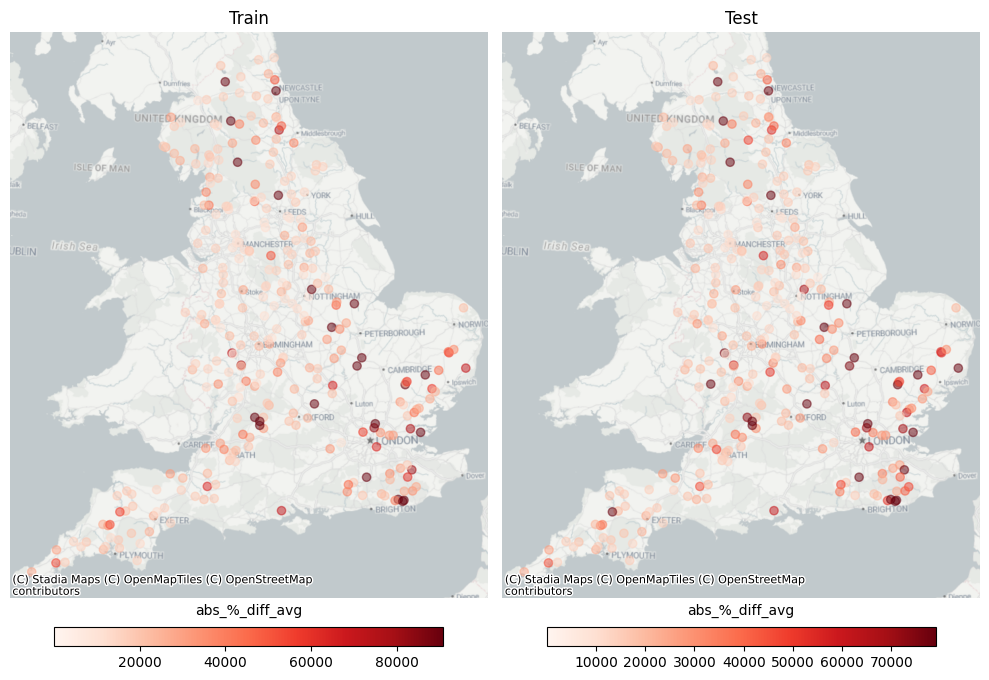

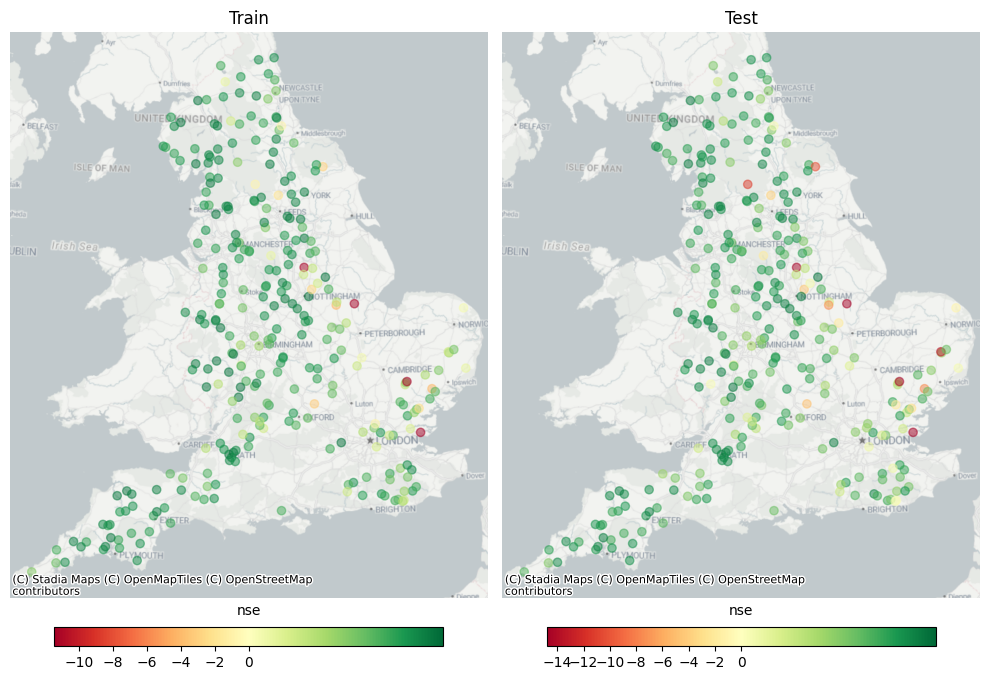

In [53]:
# CHALK CATCHMENTS (in sample)
for geometry in ['catchment_geom', 'flow-gauging-station_geom']:

    # Set geometry
    (
        train_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )
    
    (
        test_gdf_catchments_merged
            .set_geometry(
                geometry,
                inplace=True
            )
    )
    
    for var, cmap in vars_plotted_on_map:
        
        # Get plot
        fig = get_error_map(
            train_gdf_catchments_merged,
            test_gdf_catchments_merged,
            var,
            cmap,
            stadiamaps_provider,
            filter_train='chalk_stream_flag == False',
            filter_test='chalk_stream_flag == False'
        )
    
        # Log
        mlflow.log_figure(
            fig,
            f"error_analysis/catchment/charts/errors_map_{var}_{geometry}_chalk_streams.png"
        )
    
        # Show
        plt.show()

## Time series

### Viz

#### Actual Vs. Predicted **time windows** comparison

In [54]:
def plot_time_series(
    catchment_error_df,
    error_analysis_df,
    set_name,
    num_subplots,
    percent_right_batch,
    percent_left_batch,
    percent_medium_batch,
    save_dir=None
):
    
    np.random.seed(82)
    
    # Calculate the number of catchments for each batch
    total_catchments = len(catchment_error_df)
    num_right_batch = math.ceil(total_catchments * percent_right_batch)
    num_left_batch = math.ceil(total_catchments * percent_left_batch)
    num_medium_batch = math.ceil(total_catchments * percent_medium_batch)
    
    # Select catchments for each batch
    right_batch_catchments = catchment_error_df.index[-num_right_batch:]
    left_batch_catchments = catchment_error_df.index[:num_left_batch]
    remaining_catchments = catchment_error_df.index[num_left_batch:-num_right_batch]
    medium_batch_catchments = (
        np.random.choice(
            remaining_catchments,
            num_medium_batch,
            replace=False
        )
    )
    
    # Combine all selected catchments
    selected_catchments = np.concatenate([
        right_batch_catchments,
        left_batch_catchments,
        medium_batch_catchments
    ])
    
    # Plot time series for each catchment and group combination
    for catchment in selected_catchments:
        
        curr_nse = catchment_error_df.loc[catchment][f"y_{set_name}_nse"]
        
        # Retrieve data frame with only current catchments
        catchment_df = (
            error_analysis_df[
                error_analysis_df['catchmentID'] == catchment
            ]
        )
        
        # Derive groups
        groups = sorted(catchment_df['group'].unique())
        
        # Derive number of plots
        num_plots = math.ceil(len(groups) / num_subplots)
        
        # Looping on plots
        for i in range(num_plots):
            start_idx = i * num_subplots
            end_idx = (i + 1) * num_subplots
            groups_chunk = groups[start_idx:end_idx]
            len_groups_chunk = len(groups_chunk)
              
            # Define plot
            fig, axes = plt.subplots(
                len_groups_chunk,
                1,
                figsize=(10, len_groups_chunk * 4)
            )
            if len_groups_chunk == 1:
                axes = [axes]
            
            batch_type = (
                'right' if catchment in right_batch_catchments else
                'left' if catchment in left_batch_catchments else
                'medium'
            )
            fig.suptitle(
                f'{catchment} ({batch_type}: NSE={curr_nse:.2f}) / {str(i+1).zfill(2)} ',
                fontsize=16,
                y=0.945
            )
            
            # Define sub-plots
            for j, group in enumerate(groups_chunk):
                group_df = catchment_df[catchment_df['group'] == group]
                
                # Actual
                sns.lineplot(
                    data=group_df,
                    x='end_date',
                    y=f'y_{set_name}',
                    ax=axes[j],
                    label='Actual',
                    color='blue'
                )
                
                # Predicted
                sns.lineplot(
                    data=group_df,
                    x='end_date',
                    y=f'y_{set_name}_hat',
                    ax=axes[j],
                    label='Predicted',
                    color='red'
                )
                
                # Formatting
                axes[j].set_ylabel('')
                axes[j].set_xlabel('')
                axes[j].xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))
                axes[j].legend()
                axes[j].grid(True)

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])

            # Save the plot if save_dir is provided
            if save_dir:
                mlflow.log_figure(
                    fig,
                    os.path.join(
                        save_dir,
                        f"TS_{batch_type}_{catchment}_{str(i+1).zfill(2)}.png"
                    )
                )
                plt.close(fig)
            else:
                plt.show()

In [55]:
def get_quotes(q):
    percent_right_batch = q
    percent_left_batch = min(
        percent_right_batch,
        1 - percent_right_batch
    )
    percent_medium_batch = min(
        1 - percent_right_batch - percent_left_batch,
        q * 2
    )

    return percent_right_batch, percent_left_batch, percent_medium_batch


# _____
# Train

# Get quotes
percent_right_batch, percent_left_batch, percent_medium_batch = get_quotes(
    train_right_tail_catchments_quote
)
print(f"Right batch quote: {percent_right_batch:.1%} - Left batch quote: {percent_left_batch:.1%} - Medium batch quote: {percent_medium_batch:.1%}")

# Get plots
plot_time_series(
    train_catchment_error_df,
    train_error_analysis_df,
    'train',
    num_subplots=5,
    percent_right_batch=percent_right_batch,
    percent_left_batch=percent_left_batch,
    percent_medium_batch=percent_medium_batch,
    save_dir="error_analysis/timeseries/actual_vs_predicted/train"
)


# _____
# Test

# Get quotes
percent_right_batch, percent_left_batch, percent_medium_batch = get_quotes(
    test_right_tail_catchments_quote
)
print(f"Right batch quote: {percent_right_batch:.1%} - Left batch quote: {percent_left_batch:.1%} - Medium batch quote: {percent_medium_batch:.1%}")

# Get plots
plot_time_series(
    test_catchment_error_df,
    test_error_analysis_df,
    'test',
    num_subplots=5,
    percent_right_batch=percent_right_batch,
    percent_left_batch=percent_left_batch,
    percent_medium_batch=percent_medium_batch,
    save_dir="error_analysis/timeseries/actual_vs_predicted/test"
)

Right batch quote: 4.4% - Left batch quote: 4.4% - Medium batch quote: 8.8%
Right batch quote: 3.9% - Left batch quote: 3.9% - Medium batch quote: 7.8%


#### Actual Vs. Predicted catchment's **flow duration curves** comparison

In [56]:
def plot_fdc(
    error_analysis_df,
    set_name,
    save_dir=None
):

    # Define variables from `set_name`
    actual_field = f"y_{set_name}"
    predicted_field = f"y_{set_name}_hat"
    
    # Define ad-hoc data frame (already grouped by `catchmentID`)
    flow_duration_curve_grouped_df = (
        error_analysis_df[[
            'catchmentID',
            actual_field,
            predicted_field
        ]]
        .groupby('catchmentID')
    )
    
    # Loop on catchments
    for curr_catchmentID, curr_catchment_df in flow_duration_curve_grouped_df:
        
        # Pop prediction series
        y_hat_series = curr_catchment_df.pop(predicted_field)
        
        # Order by actual values
        (
            curr_catchment_df
                .sort_values(
                    ascending=False,
                    by=actual_field,
                    inplace=True
                )
        )
        
        # Reset index of current df
        curr_catchment_df.reset_index(
            drop=True,
            inplace=True
        )
        
        # Rescale index
        curr_catchment_df.index = (
            curr_catchment_df.index / 
                (curr_catchment_df.shape[0]-1)
                * 100
        )
        
        # Create a figure and axes
        fig, ax = plt.subplots(figsize=(10, 6))
    
        # Plot y_train series
        sns.lineplot(
            data=curr_catchment_df,
            x=curr_catchment_df.index,
            y=actual_field,
            ax=ax,
            label='Actual'
        )
    
        # Plot sorted y_hat_series
        sns.lineplot(
            x=curr_catchment_df.index,
            y=sorted(y_hat_series, reverse=True),
            ax=ax,
            label='Predicted'
        )
    
        # Customize the plot
        plt.title(f"{curr_catchmentID}")
        plt.xlabel('Percentage time equalled or exceeded (%)')
        plt.ylabel(r'Flow ($\mathrm{m^3/s}$)')
        
        # Set custom x-ticks
        custom_ticks = [1, 5, 10, 50, 70, 95, 99]
        plt.xticks(custom_ticks)
        
        plt.grid(
            True,
            linestyle='--',
            linewidth=0.3
        )
        
        # Save the plot if save_dir is provided
        if save_dir:
            mlflow.log_figure(
                fig,
                os.path.join(
                    save_dir,
                    f"FDC_{curr_catchmentID}.png"
                )
            )
                        
            plt.close(fig)
        else:
            plt.show()

In [57]:
# Get plots
plot_fdc(
    train_error_analysis_df,
    'train',
    save_dir="error_analysis/timeseries/fdc/train"
)

plot_fdc(
    test_error_analysis_df,
    'test',
    save_dir="error_analysis/timeseries/fdc/test"
)

# Close run

In [58]:
mlflow.end_run()

🏃 View run exponential-MAE at: http://localhost:8090/#/experiments/857377473004881540/runs/2d9a96e0b7c745848be0321c2013f5db
🧪 View experiment at: http://localhost:8090/#/experiments/857377473004881540
